In [18]:
#import numpy as np
import numpy.random as npr

import jax
import jax.numpy as jnp 
import jax.random as jrnd
import jax.scipy.stats as jsps
import jax.scipy.linalg as spla
from jax.config import config
config.update("jax_enable_x64", True)
from jax.scipy.stats import gaussian_kde

import tqdm
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

from scipy.spatial import ConvexHull

In [2]:
import gpjax as gpx
from jax import grad, jit
import jaxkern as jk
import optax as ox
from jaxutils import Dataset

/Users/dicai/miniconda3/envs/apm/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [39]:
from elliptical_slice_sampler_jax import elliptical_slice_jax
from plotting import plot_candidate

# Active phase mapping code

This notebook is specifically updating convex_envelopes_multidim to use GPjax and to (in the future) use it to update hyperparameters.

Questions:
* can we make our current jax things more efficient?
* [done] update such that it works w.r.t. a list of designs instead of knot_x
* [done] start by cleaning up existing code and make sure it's working
* [in progress] then try to get working in 2D:
    * how to compute the convex hull in higher dimensions (with jax)?
    * generate data
    * visualize hull on a triangle
* [done] general kernels + hyperparameters
    * make it s.t. we can pass in a general kernel and an optimize parameters function
    * then test everything is still the same w/ the identity for optimize_parameters and squared exponential
    * then try using GP jax to optimize hyperparameters; compare it to the implementation from the normal jax people

Next steps (as of 2/10/23):
* [done-ish] Switch out the model to use an arbitary kernel -- right now a particular RBF kernel is hardcoded, but it's easy to switch it out.
* [in progress] Implement on fake data from a 3-configuration setting 
* [done] Implement visualization for 3-configuration setting (triangles?)
* [done] Implement baseline for >1 dimensional examples
* Swap out the convex hull code (is it slow?)

In [4]:
# Non GPjax code
def kernel_rbf(x1, x2):
    """
    Squared expoential kernel with lengthscale ls. 
    """
    ls=0.1; v=1
    #ls = params["lengthscale"]; v = params["variance"]
    return v * jnp.exp(-0.5 * jnp.linalg.norm(x1-x2) ** 2 / ls ** 2)

def K(kernel, xs, ys):
    """
    Compute a Gram matrix or vector from a kernel and an array of data points.
    Args:
    kernel: callable, maps pairs of data points to scalars.
    xs: array of data points, stacked along the leading dimension.
    Returns: A 2d array `a` such that `a[i, j] = kernel(xs[i], xs[j])`.
    """
    return jax.vmap(lambda x: jax.vmap(lambda y: kernel(x, y))(ys))(xs)


def make_preds(train_x, train_y, test_x):
    """
    Given data, get pred_mean and pred_cov. 
    
    TODO: change argument to data instead of train_x, train_y?
    """
    train_K = K(kernel_rbf, train_x, train_x) + 1e-6* jnp.eye(train_x.shape[0])
    cross_K = K(kernel_rbf, train_x, test_x)
    kappa_K = K(kernel_rbf, test_x, test_x)

    # Predictive parameters.
    train_cK = spla.cholesky(train_K)
    cross_solve = spla.cho_solve((train_cK,  False), cross_K)
    pred_mean = train_y.T @ cross_solve
    pred_cov  = kappa_K - cross_K.T @ cross_solve + 1e-6*jnp.eye(test_x.shape[0])
    
    return pred_mean, pred_cov

# Compute the convex envelope given x and y values
def convelope_old(knot_x, knot_y):
    d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel_old(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))
    # TODO: 
    deriv_marg_var = jnp.max(jnp.diag(d_kernel(knot_x, knot_x, ls)))
    deriv_marg_var = 100
    s = jnp.linspace(-3*jnp.sqrt(deriv_marg_var), 3*jnp.sqrt(deriv_marg_var), 500)

    knot_y = jnp.atleast_2d(knot_y) # samples x num_primal
    print(knot_y.shape)
    sx = s[:,jnp.newaxis] * knot_x[jnp.newaxis,:] # num_dual x num_primal
    print(sx.shape)
    # compute the conjugate
    lft1 =jnp.max(sx[jnp.newaxis,:,:] - knot_y[:,jnp.newaxis,:],  axis=2) # samples x num_dual
    print(lft1.shape)
    # compute the biconjugate
    lft2 = jnp.max(sx[jnp.newaxis,:,:] - lft1[:,:,jnp.newaxis],  axis=1) # samples x num_primal
    return lft2

def get_next_candidate_baseline(data, designs, design_space):
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, 20, design_space)
    
    train_x, train_y = data
    
    # get covariances and compute log determinant
    covariances = jnp.array([make_preds(train_x, train_y, x)[1] for x in designs])
    entropy_change = 0.5 * jnp.linalg.slogdet(covariances + 1)[1]
    return entropy_change.argmax(), entropy_change

def update_model(data, T, design_space):
    N_designs = design_space.shape[0]
    train_x, train_y = data
    
    # TODO: add function to update model hyperparameters
    params = 1
    
    # sample functions ~ posterior
    pred_mean, pred_cov = make_preds(train_x, train_y, design_space) ### ? 
    pred_cK = spla.cholesky(pred_cov)
    # get T samples from the posterior
    pred_Y = pred_cK.T @ npr.randn(N_designs, T) + pred_mean[:,jnp.newaxis]
    # get s by computing the vector of tights w.r.t. posterior samples
    envelopes = convelope(design_space, pred_Y.T)
    
    return pred_mean, pred_cov, pred_cK, pred_Y, envelopes

# not needed anymore
def add_observation(data, true_y, next_x, design_space, design_inds):
    train_x, train_y = data
    #train_x = jnp.concatenate([train_x, jnp.array([design_space[design_inds[next_x]]])])
    #train_y = jnp.concatenate([train_y, jnp.array([true_y[design_inds[next_x]]])])
    train_x = jnp.concatenate([train_x, jnp.array([design_space[next_x]])])
    train_y = jnp.concatenate([train_y, jnp.array([true_y[next_x]])])
    return (train_x, train_y)


In [70]:
def make_preds_gpjax(dataset, posterior, params, test_x, verbose=False):

    latent_distribution = posterior(params, dataset)(test_x)
    likelihood = gpx.Gaussian(num_datapoints = dataset.n)
    predictive_distribution = likelihood(params, latent_distribution)

    pred_mean = predictive_distribution.mean()
    pred_cov = predictive_distribution.covariance()
    
    return pred_mean, pred_cov

def update_model_gpjax(dataset, design_space, rng_key, update_params=False, num_iters=500, lr=1e-3):
    
    # Define model
    prior = gpx.Prior(kernel = jk.RBF())
    likelihood = gpx.Gaussian(num_datapoints = dataset.n)
    posterior = prior * likelihood
    
    if update_params:
        # Update hyperparameters
        mll = jit(posterior.marginal_log_likelihood(dataset, negative=True))
        opt = ox.adam(learning_rate=lr)
        parameter_state = gpx.initialise(posterior, key=rng_key)
        parameter_state = gpx.fit(mll, parameter_state, opt, num_iters=num_iters)
    else:
        # Use default parameters
        parameter_state = gpx.initialise(posterior, key=rng_key, 
                                         kernel={"lengthscale": jnp.array([0.1]), "variance": jnp.array([1])},
                                        likelihood={'obs_noise': jnp.array([0])})

    params = parameter_state.params
    pred_mean, pred_cov = make_preds_gpjax(dataset, posterior, params, design_space) ### ? 
    
    return pred_mean, pred_cov, posterior, params

def sample_from_posterior(pred_mean, pred_cov, design_space, T):
    # TODO: clean this up -- not necessary
    # sample functions ~ posterior
    N_designs = design_space.shape[0]
    pred_cK = spla.cholesky(pred_cov)
    # get T samples from the posterior
    pred_Y = pred_cK.T @ npr.randn(N_designs, T) + pred_mean[:, jnp.newaxis]
    # get s by computing the vector of tights w.r.t. posterior samples
    envelopes = convelope(design_space, pred_Y.T)
    
    return pred_Y, envelopes, pred_cK

def sample_from_posterior_gpjax(pred_mean, pred_cov, design_space, T):
    """
    Sample from the posterior predictive model
    """
    # TODO: clean this up -- not necessary
    #return pred_Y, envelopes, pred_cK


def convelope(design_space, knot_y):

    N, D = design_space.shape
    deriv_marg_var = 10 #0
    num_dual = 200
    d_kernel = jax.jit(jax.vmap(jax.grad(jax.grad(lambda x1, x2, ls: kernel_old(x1, x2, ls)[0,0], argnums=0), argnums=1), in_axes=(0,0,None)))
    # TODO: 
    #deriv_marg_var = np.max(jnp.diag(d_kernel(knot_x, knot_x, ls)))
    #print(deriv_marg_var)
    s = jnp.linspace(-3*jnp.sqrt(deriv_marg_var), 3*jnp.sqrt(deriv_marg_var), num_dual)
    ss = jnp.meshgrid(*[s.ravel()]*D)
    s = jnp.array([sx.flatten() for sx in ss]).T

    knot_y = jnp.atleast_2d(knot_y) # samples x num_primal
    #print(knot_y.shape)
    
    prod = (design_space @ s.T).T
    #print(prod.shape)
    
    # compute the conjugate
    lft1 = jnp.max(prod[jnp.newaxis,:,:] - knot_y[:,jnp.newaxis,:],  axis=2) # samples x num_dual
    #print(lft1.shape)
    # compute the biconjugate
    lft2 = jnp.max(prod[jnp.newaxis,:,:] - lft1[:,:,jnp.newaxis],  axis=1) # samples x num_primal
    
    return lft2


def generate_true_function(design_space, knot_N): # todo: pass kernel as argument
    # TODO: make it such that we can pass in a dimension too? or just stick to 1d vs 2d. 
    #knot_x = jnp.linspace(0, 1, knot_N)
    knot_K = K(kernel_rbf, design_space, design_space) + 1e-8 * jnp.eye(knot_N)
    # Cholesky decomposition of the kernel matrix
    knot_cK = spla.cholesky(knot_K)
    # Form the true function of interest at knot_N number of points
    true_y = knot_cK.T @ npr.randn(knot_N)
    # compute envelope based on true function
    true_envelope = convelope(design_space, true_y)
    
    return true_y, true_envelope


def get_next_candidate_baseline_gpjax(posterior, params, dataset, designs, design_space):
    # get covariances and compute log determinant
    covariances = jnp.array([make_preds_gpjax(dataset, posterior, params, x)[1] for x in designs])
    entropy_change = 0.5 * jnp.linalg.slogdet(covariances + 1)[1]
    return designs[entropy_change.argmax()], entropy_change

In [34]:
def ess_and_estimate_entropy(putative_x, design_space, data, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    # sample J*3 number of points but only keep the last J 
    def same_tight(y, tight):
        new_hull = convelope(design_space, y).ravel()
        new_tight = y - new_hull < 1e-3
        ##points = jnp.hstack([design_space, y[:, jnp.newaxis]])
        #hull = ConvexHull(points)
        #new_tight = jnp.zeros(len(design_space))
        new_tight[hull.vertices] = 1
        return jnp.all(tight == new_tight)

    # samples of f given tights
    totsamps = J*3
    samps = elliptical_slice_jax(y.ravel(), lambda x: jnp.log(same_tight(x, s)), cK, totsamps, rng_key)
    test_samps = samps[totsamps-J:totsamps]
    
    # get 1d predictive y samples at values of design space
    def make_pred_single(train_y):
        pred_mean, pred_cov = make_preds(design_space, train_y, putative_x)
        return pred_mean.ravel()[0], pred_cov.ravel()[0]
    
    #make_pred_single_wrap = lambda yarg: make_pred_single(design_space, yarg, putative_x) ## TODO knot_x is global var here
    makepred_vmap = jax.jit(jax.vmap(make_pred_single, in_axes=(0,)))
    
    mus, sigmas = makepred_vmap(test_samps)
    
    #vals = jnp.array([make_pred_single_wrap(ts) for ts in test_samps])
    #mus = vals[:,0]; sigmas = vals[:,1]
    ystars = jrnd.multivariate_normal(rng_key, mus, jnp.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    #ystars = npr.multivariate_normal(mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate
    #return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J)
    
    
def ess_and_estimate_entropy_test(putative_x, design_space, data, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    # sample J*3 number of points but only keep the last J 
    def same_tight(y, tight):
        new_hull = convelope(design_space, y).ravel()
        new_tight = y - new_hull < 1e-3
        return jnp.all(tight == new_tight)

    # samples of f given tights
    totsamps = J*3
    samps = elliptical_slice_jax(y.ravel(), lambda x: jnp.log(same_tight(x, s)), cK, totsamps, rng_key)
    test_samps = samps[totsamps-J:totsamps]
    
    x_ind = (putative_x == design_space).argmax()
    ystars = test_samps[:, x_ind]
    
    """
    # get 1d predictive y samples at values of design space
    def make_pred_single(train_y):
        pred_mean, pred_cov = make_preds(design_space, train_y, putative_x)
        return pred_mean.ravel()[0], pred_cov.ravel()[0]
    
    #make_pred_single_wrap = lambda yarg: make_pred_single(design_space, yarg, putative_x) ## TODO knot_x is global var here
    #makepred_vmap = jax.jit(jax.vmap(make_pred_single, in_axes=(0,)))
    
    mus, sigmas = makepred_vmap(test_samps)
    
    #vals = jnp.array([make_pred_single_wrap(ts) for ts in test_samps])
    #mus = vals[:,0]; sigmas = vals[:,1]
    ystars = jrnd.multivariate_normal(rng_key, mus, jnp.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    #ystars = npr.multivariate_normal(mus, np.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    """
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate
    #return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J)

In [79]:
from scipy.spatial import ConvexHull
import numpy as np

def convex_envelope(x, fs):
    ## TODO: make this more efficient
    """Computes convex envelopes of M functions which share a common grid.
    x is an (N, D)-matrix corresponding to the grid in D-dimensional space and fs is an (M, N)-matrix.
    The i-th function is given by the pairs (x[0], fs[i, 0]), ..., (x[N-1], fs[i, N-1]).
    The envelopes are returned as a list of lists.
    The i-th list is of the form [j_1, j_2, ..., j_n] where (X[j_k], fs[i, j_k]) is a point in the envelope.
    
    Keyword arguments:
    x  -- A shape=(N,D) numpy array.
    fs -- A shape=(M,N) or shape=(N,) numpy array."""
    
    #assert(len(fs.shape) <= 2)
    if len(fs.shape) == 1: fs = np.reshape(fs, (-1, fs.shape[0]))
    M, N = fs.shape
    
    #assert(len(x.shape) <= 2)
    #if len(x.shape) == 1: x = np.reshape(x, (-1, 1))
    #assert(x.shape[0] == N)
    D = x.shape[1]
    
    fs_pad = np.empty((M, N+2))
    fs_pad[:, 1:-1], fs_pad[:, (0,-1)] = fs, np.max(fs) + 1.
    
    x_pad = np.empty((N+2, D))
    x_pad[1:-1, :], x_pad[0, :], x_pad[-1, :] = x, x[0, :], x[-1, :]
    
    results = []
    for i in range(M):
        epi = np.column_stack((x_pad, fs_pad[i, :]))
        hull = ConvexHull(epi)
        result = [v-1 for v in hull.vertices if 0 < v <= N]
        #result.sort()
        results.append(np.array(result))
    
    return np.array(results)

def is_vertex(points):
    N, D = points.shape
    vertices = convex_envelope(points[:, :-1], points[:, -1])[0]
    s = np.zeros(N)
    s[vertices] = 1
    return s.astype("bool")
    
def is_tight(design_space, true_y):

    points = jnp.hstack([design_space, true_y[:, jnp.newaxis]])
    _scipy_hull = lambda points: is_vertex(points) 

    result_shape_dtype = jax.ShapeDtypeStruct(
          shape=jnp.broadcast_shapes(true_y.shape),
          dtype='bool')

    return jax.pure_callback(_scipy_hull, result_shape_dtype, points, vectorized=True)

In [80]:
true_y - true_envelope < 1e-3

Array([[ True, False, False, False,  True,  True, False, False, False,
        False, False,  True,  True, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True,  True,  True,
         True,  True, False,  True]], dtype=bool)

In [83]:
is_tight(design_space, true_y)[jnp.newaxis, :]

Array([[ True, False, False, False,  True,  True, False, False, False,
        False, False,  True,  True, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True,  True,  True,
         True,  True, False,  True]], dtype=bool)

In [98]:
def same_tight_1d(y, tight):
    new_hull = convelope(design_space, y).ravel()
    #new_hull = is_tight(design_space, y)
    new_tight = y - new_hull < 1e-3
    return jnp.all(tight == new_tight)

def same_tight(y, tight):
    #new_hull = convelope(design_space, y).ravel()
    new_tight = is_tight(design_space, y) #[jnp.newaxis, :]
    #new_tight = y - new_hull < 1e-3
    return jnp.all(tight == new_tight)

In [66]:
# samples of f given tights
totsamps = 200*3
cK = pred_cK = spla.cholesky(pred_cov)
samps = %time elliptical_slice_jax(true_y.ravel(), lambda x: jnp.log(same_tight(x, true_envelope)), cK, totsamps, rng_key)

CPU times: user 854 ms, sys: 162 ms, total: 1.02 s
Wall time: 1.02 s


In [74]:
401 * 200  / 1000

80.2

In [100]:
%timeit same_tight(true_y, true_envelope)

13.7 ms ± 468 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [71]:
%timeit same_tight(true_y, true_envelope)

842 µs ± 8.31 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [31]:
%timeit old_tight(true_y, true_envelope)

2.69 ms ± 887 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [97]:
tights[:, 1] == is_tight(design_space, true_y)

Array([ True,  True,  True,  True, False, False,  True,  True,  True,
        True,  True, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False, False, False,
       False, False,  True,  True], dtype=bool)

Array(False, dtype=bool)

In [35]:
jsps.gaussian_kde(samps[30:100][:, iind])

gaussian_kde(neff=Array(70., dtype=float64), dataset=Array([[ 1.54999124e-02,  1.50429084e-02,  1.39976570e-02,
        -1.05000516e-02,  8.61618571e-03,  6.16190648e-03,
         5.97753143e-03,  5.84883128e-03,  7.35502269e-03,
         5.89236512e-03, -6.66155905e-03, -1.72792451e-02,
         6.78877804e-03,  1.33168531e-02,  1.29504394e-03,
         6.11121878e-03,  2.51632727e-03, -1.32985131e-04,
        -6.65036490e-03,  8.39006668e-03,  2.40115438e-02,
         1.45225550e-02, -8.13367586e-03, -8.76372241e-03,
         7.39581958e-03, -8.70077872e-03, -3.47259310e-04,
        -1.99070432e-02, -1.28813439e-03, -1.59058685e-03,
         1.26893264e-03,  6.53400938e-03, -9.57501046e-05,
         7.57076062e-03,  7.31193978e-03,  3.09533266e-03,
        -3.03371789e-03,  1.61525767e-03,  9.90914454e-03,
        -1.64798408e-03, -2.56560777e-03, -1.37177103e-02,
         1.28692743e-02, -7.35960804e-03,  1.69176745e-02,
         1.60755015e-02,  1.17584473e-02, -1.76772606e-03,
   

In [102]:
putative_x = design_space[1]
J = 10

def entropy_est_wrap(args):
    tights_i, pred_Y_i = args
    return ess_and_estimate_entropy_gpjax_test(putative_x, design_space, dataset, posterior, params, tights_i, pred_Y_i, pred_cK, rng_key, J=J)
ventropy_est = jax.vmap(entropy_est_wrap, in_axes=((1,1),))
    

pred_Y, envelopes, _ = sample_from_posterior(pred_mean, pred_cov, design_space, 15)
tights = jnp.abs(envelopes.T - pred_Y) < 1e-3

entropies = ventropy_est((tights, pred_Y))  


In [ ]:
tights[1]

In [64]:
entropy_est_wrap((tights[:, 1], pred_Y[:, 1]))

Array(-3.50239086, dtype=float64)

In [6]:
def compute_IG_putative_x(putative_x, design_space, data, pred_cK, pred_Y, tights, rng_key, T=100, J=200):
    """
    Compute a Monte Carlo approximation of the IG w.r.t. T samples of s_t ~ p(s | data).
    
    The inner entropy is approximated via Monte Carlo + a KDE estimator constructed from the samples. 
    (TODO: don't use the same data twice)
    
    T: number of samples for the outer expectation
    J: number of ESS samples (controls the # of samples for the inner MC too?)
    """

    def entropy_est_wrap(args):
        tights_i, pred_Y_i = args
        return ess_and_estimate_entropy_test(putative_x, design_space, data, tights_i, pred_Y_i, pred_cK, rng_key, J=J)
    ventropy_est = jax.jit(jax.vmap(entropy_est_wrap, in_axes=((1,1),)))
    
    entropies = ventropy_est((tights, pred_Y))  
    #entropies = jnp.array([ess_and_estimate_entropy(putative_x, design_space, data, tights[:,i], pred_Y[:,i], pred_cK, rng_key, J=J) for i in range(len(tights))])
    
    # estimate of the second term in the EIG
    return entropies.mean()
    

def get_next_candidate(data, design_inds, design_space, rng_key, T=30, J=40, tol=1e-3):
    """
    Given current data and a list of designs, computes an IG score for each design. 
    
    T: number of outer MC samples
    J: number of inner MC samples
    tol: tolerance for considering what is tight w.r.t. the convex hull
    
    Returns the best design and the list of scores. 
    """
    
    #print(design_inds)

    # updates the model and samples T functions and computes their envelopes. here we evaluate functions only at points in the design space
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T, design_space) 
    # compute the vector of indicators
    tights = jnp.abs(envelopes.T - pred_Y) < tol ## NOTE: we transposed the shape from what it was before
    
    # TODO: move the lambda function into the vmap to make it cleaner
    compute_IG_putative_wrap = lambda x: compute_IG_putative_x(x, design_space, data, pred_cK, pred_Y, tights, rng_key, T = T, J = J) 
    compute_IG_vmap = jax.jit(jax.vmap(compute_IG_putative_wrap, in_axes=0))
    
    #curr_entropy = jnp.log(jnp.sqrt(2*jnp.pi*jnp.e*jnp.diag(pred_cov[jnp.ix_(design_inds, design_inds)]))) # TOD0: need to index the relevant designs
    curr_entropy = 0.5 * jnp.log(2 * jnp.pi * jnp.e * jnp.diag(pred_cov)) 
    mean_entropy = compute_IG_vmap(design_space[design_inds,:])
    
    entropy_change = curr_entropy - mean_entropy
    return entropy_change.argmax(), entropy_change




def plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, dataset, next_x, scores, plot_eig=True, legend=True, plot_hulls=True):
    #train_x, train_y = data
    
    plt.figure(figsize=(10,4))

    # Plot true function, convex hull, and GP model mean + uncertainty
    plt.plot(knot_x, true_y, "k", lw=2, label="True function")
    plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
    plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model prediction")
    y_err = 2 * jnp.sqrt(jnp.diag(pred_cov))
    plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
    
    if plot_hulls:
        # Plot convex hulls of posterior samples
        plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

    # Plot data / next evaluation
    plt.scatter(next_x, get_next_y(true_y, knot_x[:,jnp.newaxis], next_x), marker="*", color="tab:red", zorder=5, sizes=[150], label="Next evaluation")
    plt.scatter(dataset.X, dataset.y, label="Observed data", c="k", zorder=5)

    # Plot the entropy estimates (i.e., -second term of EIG)
    if plot_eig:
        plt.scatter(knot_x, scores, c="purple", marker="|", label="EIG")
        
    if legend:
        plt.legend(ncol=2)

    plt.ylim(-3,3); plt.xlabel("Composition space"); plt.ylabel("Energy")
    


def compute_distances(data, true_envelopes):
    distances = []
    for (i,x) in enumerate(data[0]):
        x_idx = (knot_x == x).argmax()
        distances.append(jnp.abs(data[1][i] - true_envelope[1][x_idx]))
    return jnp.array(distances)

def get_next_y(true_y, design_space, next_x):
    return true_y[:,jnp.newaxis][design_space == next_x]


def plot_candidate_old(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, scores, plot_eig=True, legend=True, plot_hulls=True):
    train_x, train_y = data
    
    plt.figure(figsize=(10,4))

    # Plot true function, convex hull, and GP model mean + uncertainty
    plt.plot(knot_x, true_y, "k", lw=2, label="True function")
    plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
    plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
    y_err = jnp.sqrt(jnp.diag(pred_cov))
    plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
    
    if plot_hulls:
        # Plot convex hulls of posterior samples
        plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

    # Plot data / next evaluation
    plt.scatter(knot_x[next_x], true_y[next_x], marker="*", color="tab:red", zorder=5, sizes=[150], label="Next evaluation")
    plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

    # Plot the entropy estimates (i.e., -second term of EIG)
    if plot_eig:
        plt.scatter(knot_x, scores, c="purple", marker="|", label="EIG")
        
    if legend:
        plt.legend(ncol=2)

    plt.ylim(-3,3); plt.xlabel("Composition space"); plt.ylabel("Energy")

In [101]:
def compute_IG_putative_x_gpjax(putative_x, design_space, dataset, posterior, params, pred_cK, pred_Y, tights, rng_key, T=100, J=200):
    """
    Compute a Monte Carlo approximation of the IG w.r.t. T samples of s_t ~ p(s | data).
    
    The inner entropy is approximated via Monte Carlo + a KDE estimator constructed from the samples. 
    (TODO: don't use the same data twice)
    
    T: number of samples for the outer expectation
    J: number of ESS samples (controls the # of samples for the inner MC too?)
    """

    def entropy_est_wrap(args):
        tights_i, pred_Y_i = args
        return ess_and_estimate_entropy_gpjax_test(putative_x, design_space, dataset, posterior, params, tights_i, pred_Y_i, pred_cK, rng_key, J=J)
    #ess_and_estimate_entropy_gpjax(putative_x, design_space, dataset, posterior, params, s, y, cK, rng_key, J=50)
    ventropy_est = jax.jit(jax.vmap(entropy_est_wrap, in_axes=((1,1),)))
    
    entropies = ventropy_est((tights, pred_Y))  
    #entropies = jnp.array([ess_and_estimate_entropy(putative_x, design_space, data, tights[:,i], pred_Y[:,i], pred_cK, rng_key, J=J) for i in range(len(tights))])
    
    # estimate of the second term in the EIG
    return entropies.mean()
    
def ess_and_estimate_entropy_gpjax(putative_x, design_space, dataset, posterior, params, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    # sample J*3 number of points but only keep the last J 
    def same_tight(y, tight):
        new_hull = convelope(design_space, y).ravel()
        new_tight = y - new_hull < 1e-3
        return jnp.all(tight == new_tight)

    # samples of f given tights
    totsamps = J*3
    samps = elliptical_slice_jax(y.ravel(), lambda x: jnp.log(same_tight(x, s)), cK, totsamps, rng_key)
    test_samps = samps[totsamps-J:totsamps]
    
    # get 1d predictive y samples at values of design space
    #make_preds_gpjax(dataset, posterior, params, test_x, verbose=False)
    def make_pred_single(train_y):
        # make a prediction w.r.t. the full design space
        data_values = Dataset(X = design_space, y = train_y[:, jnp.newaxis])
        pred_mean, pred_cov = make_preds_gpjax(data_values, posterior, params, putative_x)
        return pred_mean.ravel()[0], pred_cov.ravel()[0]
    
    makepred_vmap = jax.jit(jax.vmap(make_pred_single, in_axes=(0,)))
    
    mus, sigmas = makepred_vmap(test_samps)
    ystars = jrnd.multivariate_normal(rng_key, mus, jnp.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate
    #return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J) 
    
def ess_and_estimate_entropy_gpjax_test(putative_x, design_space, dataset, posterior, params, s, y, cK, rng_key, J=50):
    """
    Get samples of function conditioned on tights, get samples of y preds conditioned on 
        these samples, and then estimate the entropy.
    """
    # sample J*3 number of points but only keep the last J 
    #def same_tight(y, tight):
    #    new_hull = convelope(design_space, y).ravel()
    #    new_tight = y - new_hull < 1e-3
    #    return jnp.all(tight == new_tight)
    
    def same_tight_1d(y, tight):
        new_hull = convelope(design_space, y).ravel()
        #new_hull = is_tight(design_space, y)
        new_tight = y - new_hull < 1e-3
        return jnp.all(tight == new_tight)

    def same_tight(y, tight):
        #new_hull = convelope(design_space, y).ravel()
        #new_hull = is_tight(design_space, y)
        #new_tight = y - new_hull < 1e-3
        new_tight = is_tight(design_space, y)[jnp.newaxis, :]
        return jnp.all(tight == new_tight)

    # samples of f given tights
    totsamps = J*3
    samps = elliptical_slice_jax(y.ravel(), lambda x: jnp.log(same_tight_1d(x, s)), cK, totsamps, rng_key)
    test_samps = samps[totsamps-J:totsamps]
    
    x_ind = (putative_x == design_space).argmax()
    ystars = test_samps[:, x_ind]
    
    """
    # get 1d predictive y samples at values of design space
    #make_preds_gpjax(dataset, posterior, params, test_x, verbose=False)
    def make_pred_single(train_y):
        # make a prediction w.r.t. the full design space
        data_values = Dataset(X = design_space, y = train_y[:, jnp.newaxis])
        pred_mean, pred_cov = make_preds_gpjax(data_values, posterior, params, putative_x)
        return pred_mean.ravel()[0], pred_cov.ravel()[0]
    
    makepred_vmap = jax.jit(jax.vmap(make_pred_single, in_axes=(0,)))
    
    mus, sigmas = makepred_vmap(test_samps)
    ystars = jrnd.multivariate_normal(rng_key, mus, jnp.eye(len(mus))*sigmas) # TODO: just rescale by cholesky + mean
    """
    
    # compute a KDE estimator of density p(y | s, data, putative_x)
    ypred_kde = jsps.gaussian_kde(ystars, bw_method='scott', weights=None)
    
    # evaluate the log probability on the samples y^{(j)}
    return -ypred_kde.logpdf(ystars).mean() # inner MC estimate
    #return estimate_entropy_cond_s(samps_f, putative_x, s, rng_key, J) 
    
def get_next_candidate_baseline_gpjax(posterior, params, dataset, designs, design_space):
    # get covariances and compute log determinant
    covariances = jnp.array([make_preds_gpjax(dataset, posterior, params, x)[1] for x in designs])
    entropy_change = 0.5 * jnp.linalg.slogdet(covariances + 1)[1]
    return designs[entropy_change.argmax()], entropy_change


def get_next_candidate_gpjax(posterior, params, dataset, designs, design_space, rng_key, T=30, J=40, tol=1e-3):
    """
    Given current data and a list of designs, computes an IG score for each design. 
    
    T: number of outer MC samples
    J: number of inner MC samples
    tol: tolerance for considering what is tight w.r.t. the convex hull
    
    Returns the best design and the list of scores. 
    """

    # updates the model and samples T functions and computes their envelopes. here we evaluate functions only at points in the design space
    #pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, T, design_space) 
    # compute the vector of indicators
    pred_mean, pred_cov = make_preds_gpjax(dataset, posterior, params, design_space)
    pred_Y, envelopes, pred_cK = sample_from_posterior(pred_mean, pred_cov, design_space, T)
    tights = jnp.abs(envelopes.T - pred_Y) < tol ## NOTE: we transposed the shape from what it was before
    
    # TODO: move the lambda function into the vmap to make it cleaner
    compute_IG_putative_wrap = lambda x: compute_IG_putative_x_gpjax(x, design_space, dataset, posterior, params, pred_cK, pred_Y, tights, rng_key, T = T, J = J) 
    compute_IG_vmap = jax.jit(jax.vmap(compute_IG_putative_wrap, in_axes=0))
    
    # TODO: faster to find relevant indicies?
    _, pred_cov_designs = make_preds_gpjax(dataset, posterior, params, designs)
    #curr_entropy = jnp.log(jnp.sqrt(2 * jnp.pi * jnp.e * jnp.diag(pred_cov_designs)))
    curr_entropy = 0.5 * jnp.log(2 * jnp.pi * jnp.e * jnp.diag(pred_cov_designs)) 
    mean_entropy = compute_IG_vmap(designs)
    
    entropy_change = curr_entropy - mean_entropy
    return designs[entropy_change.argmax()], entropy_change



In [42]:
"""
dataset = gpx.Dataset(X=train_x, y=train_y[:,jnp.newaxis])

# Define model
prior = gpx.Prior(kernel = jk.RBF())
likelihood = gpx.Gaussian(num_datapoints = dataset.n)
posterior = prior * likelihood

# Update hyperparameters
mll = jit(posterior.marginal_log_likelihood(dataset, negative=True))
opt = ox.adam(learning_rate=1e-3)
parameter_state = gpx.initialise(posterior, key=rng_key)
inference_state = gpx.fit(mll, parameter_state, opt, num_iters=500)

xtest = jnp.linspace(-3., 3., 100).reshape(-1, 1)

latent_distribution = posterior(learned_params, dataset)(xtest[0])
predictive_distribution = likelihood(learned_params, latent_distribution)

predictive_mean = predictive_distribution.mean()
predictive_cov = predictive_distribution.covariance()
"""

'\ndataset = gpx.Dataset(X=train_x, y=train_y[:,jnp.newaxis])\n\n# Define model\nprior = gpx.Prior(kernel = jk.RBF())\nlikelihood = gpx.Gaussian(num_datapoints = dataset.n)\nposterior = prior * likelihood\n\n# Update hyperparameters\nmll = jit(posterior.marginal_log_likelihood(dataset, negative=True))\nopt = ox.adam(learning_rate=1e-3)\nparameter_state = gpx.initialise(posterior, key=rng_key)\ninference_state = gpx.fit(mll, parameter_state, opt, num_iters=500)\n\nxtest = jnp.linspace(-3., 3., 100).reshape(-1, 1)\n\nlatent_distribution = posterior(learned_params, dataset)(xtest[0])\npredictive_distribution = likelihood(learned_params, latent_distribution)\n\npredictive_mean = predictive_distribution.mean()\npredictive_cov = predictive_distribution.covariance()\n'

# Example on the 1-simplex

## Without convex hull (baseline)

CPU times: user 1.01 s, sys: 14.2 ms, total: 1.03 s
Wall time: 1.03 s
CPU times: user 781 ms, sys: 7.62 ms, total: 789 ms
Wall time: 786 ms
CPU times: user 762 ms, sys: 7.18 ms, total: 769 ms
Wall time: 766 ms
CPU times: user 751 ms, sys: 8.91 ms, total: 759 ms
Wall time: 757 ms
CPU times: user 744 ms, sys: 8.51 ms, total: 752 ms
Wall time: 750 ms
CPU times: user 740 ms, sys: 7.9 ms, total: 748 ms
Wall time: 745 ms


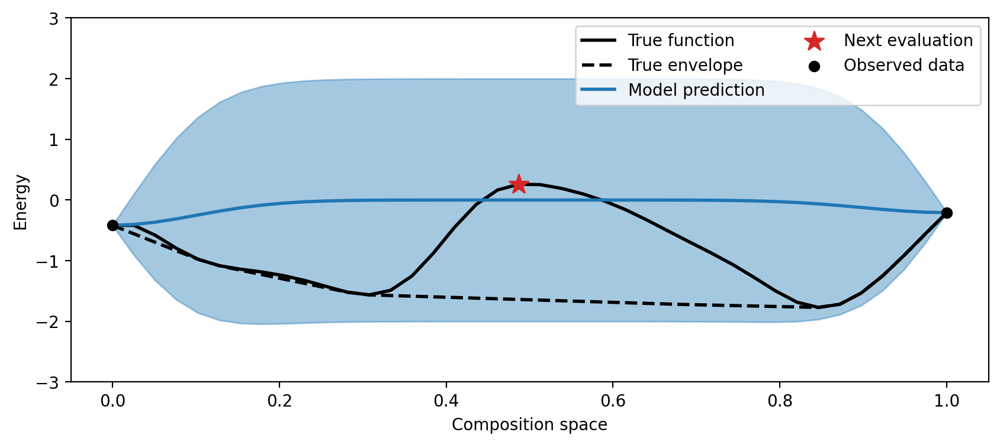

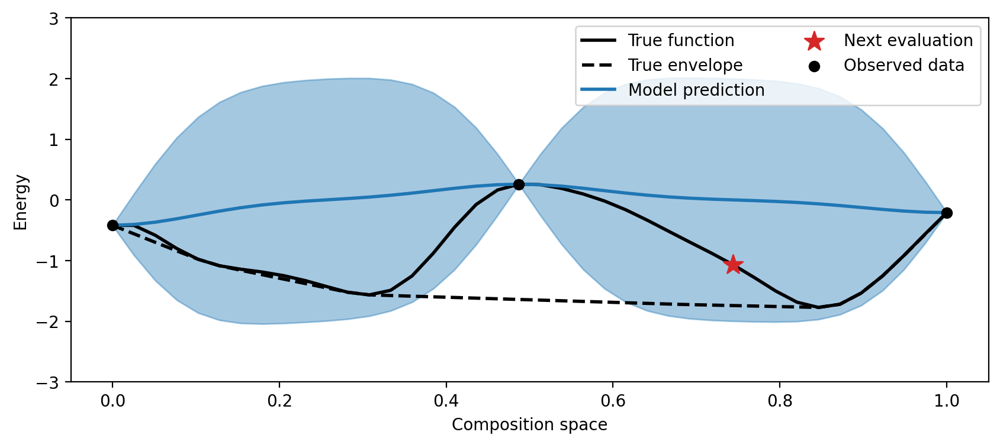

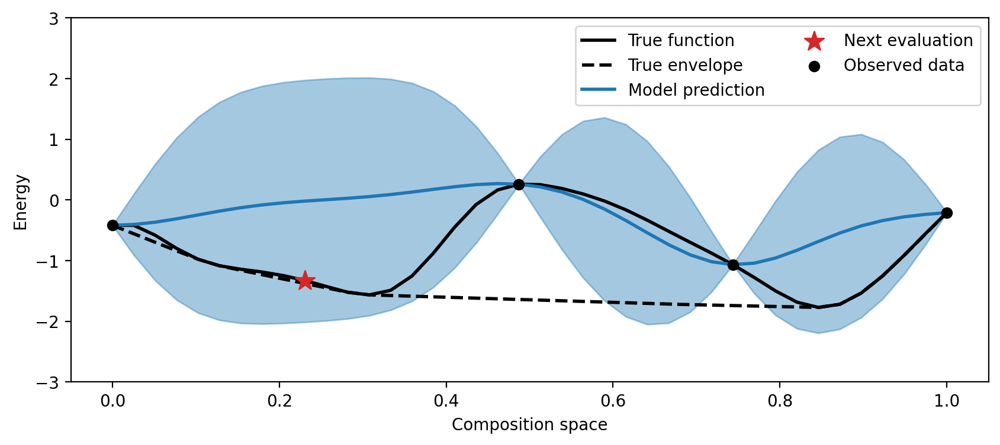

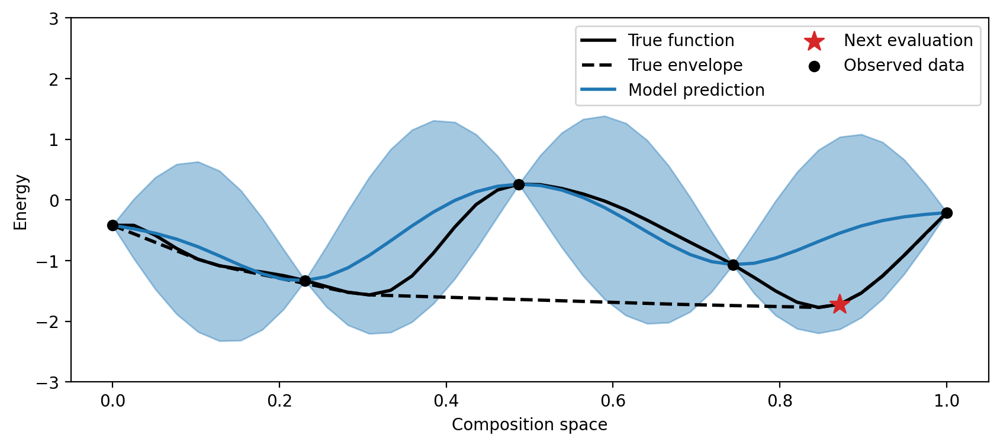

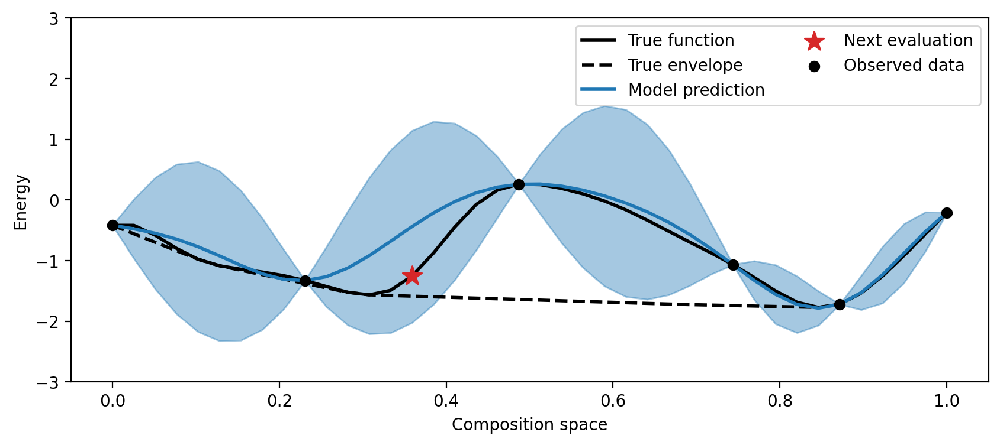

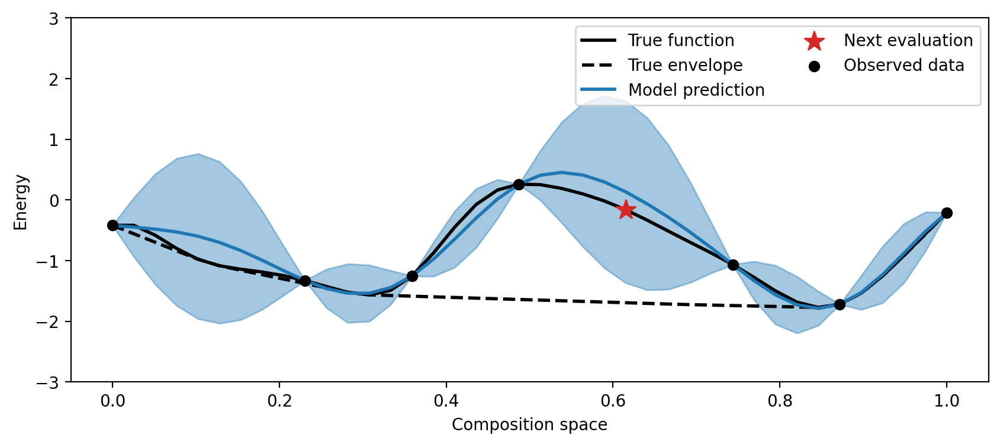

In [9]:
###  baseline
seed = 2
num_iters = 6
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

# grid to discretize design space into
knot_N = 40
knot_x = jnp.linspace(0, 1, knot_N)
design_space = knot_x[:, jnp.newaxis]

true_y, true_envelope = generate_true_function(design_space, knot_N)

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([design_space[0], design_space[-1]]); train_y = jnp.array([true_y[0], true_y[-1]])
#data = (train_x, train_y) # TODO: get rid of this eventually
dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])
designs = design_space[1:-1]

pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)

for i in range(num_iters):

    %time next_x, entropy_change = get_next_candidate_baseline_gpjax(posterior, params, dataset, designs, design_space)
    #print(next_x, entropy_change)
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, [], dataset, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data and update model
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(get_next_y(true_y, design_space, next_x)))
    designs = jnp.delete(designs, (designs == next_x).argmax())[:, jnp.newaxis]
    pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)

## With convex hull

Iteration:  0


XlaRuntimeError: INTERNAL: Generated function failed: CpuCallback error: ValueError: too many values to unpack (expected 2)

At:
  /var/folders/4v/yjlz4wlj08n26k6x_vpckx500000gn/T/ipykernel_92695/1834713683.py(41): is_vertex
  /var/folders/4v/yjlz4wlj08n26k6x_vpckx500000gn/T/ipykernel_92695/1834713683.py(50): <lambda>
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/callback.py(143): _flat_callback
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/callback.py(43): pure_callback_impl
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/callback.py(106): _callback
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/interpreters/mlir.py(1803): _wrapped_callback
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/interpreters/pxla.py(2108): __call__
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/profiler.py(314): wrapper
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/pjit.py(1309): _pjit_call_impl
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/core.py(789): process_primitive
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/core.py(346): bind_with_trace
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/core.py(2559): bind
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/pjit.py(185): _python_pjit_helper
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/pjit.py(237): cache_miss
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/jax/_src/traceback_util.py(163): reraise_with_filtered_traceback
  /var/folders/4v/yjlz4wlj08n26k6x_vpckx500000gn/T/ipykernel_92695/237513767.py(134): get_next_candidate_gpjax
  <timed exec>(1): <module>
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/magics/execution.py(1318): time
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(2369): run_line_magic
  /var/folders/4v/yjlz4wlj08n26k6x_vpckx500000gn/T/ipykernel_92695/108126698.py(28): <module>
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3460): run_code
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3400): run_ast_nodes
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3221): run_cell_async
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/async_helpers.py(129): _pseudo_sync_runner
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(3016): _run_cell
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/IPython/core/interactiveshell.py(2961): run_cell
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/zmqshell.py(531): run_cell
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/ipkernel.py(411): do_execute
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/kernelbase.py(729): execute_request
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/kernelbase.py(406): dispatch_shell
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/kernelbase.py(499): process_one
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/kernelbase.py(510): dispatch_queue
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/asyncio/events.py(80): _run
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/asyncio/base_events.py(1906): _run_once
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/asyncio/base_events.py(603): run_forever
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/tornado/platform/asyncio.py(215): start
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel/kernelapp.py(711): start
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/traitlets/config/application.py(992): launch_instance
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/site-packages/ipykernel_launcher.py(17): <module>
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/runpy.py(86): _run_code
  /Users/dicai/anaconda3/envs/gpjax/lib/python3.10/runpy.py(196): _run_module_as_main


24 [-0.30819112  1.56663718 -0.22870128  0.94900495 -0.44851176  1.33049873
  1.36371648 -0.59715371  1.07450127  1.04640727 -0.7055809   1.30598375
  1.28380681 -0.7348991   1.0098263   1.12702318 -0.17121862  1.43821106
  1.34881317  0.07455687  1.17880692  0.17251576  1.57243486  1.71583797
  1.73312936  1.51270814 -0.21683643  0.36927305 -0.42980746  0.01879719
 -0.59356068 -0.101057   -0.81689384  0.71782418  1.23727497  0.98428715
 -0.61005803  0.51049599 -0.30476607 -0.09867052]


ValueError: x and y must be the same size

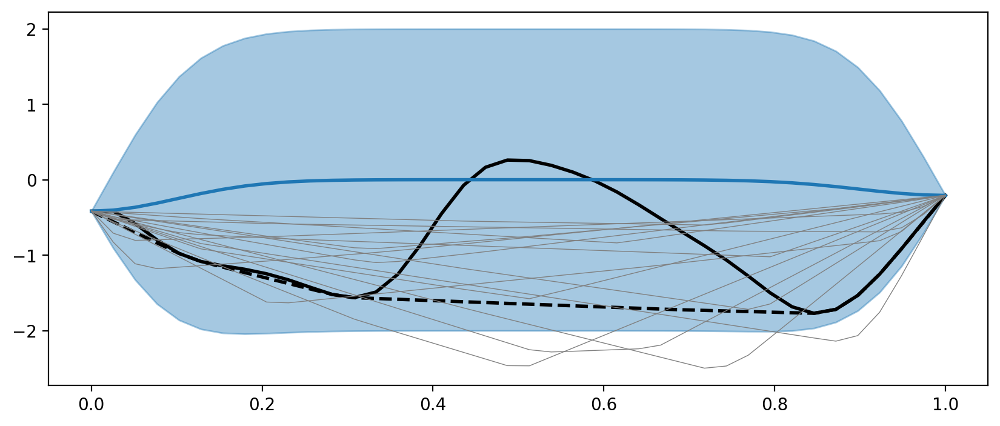

In [46]:
seed = 2
num_iters = 10
knot_N = 40
npr.seed(seed); rng_key = jrnd.PRNGKey(1)

# grid to discretize design space into
knot_x = jnp.linspace(0, 1, knot_N)
design_space = knot_x[:, jnp.newaxis]

true_y, true_envelope = generate_true_function(design_space, knot_N)

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([design_space[0], design_space[-1]]); train_y = jnp.array([true_y[0], true_y[-1]])
#data = (train_x, train_y) # TODO: get rid of this eventually
dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])

#designs = design_space
designs = design_space[1:-1]
# update model
pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)

#print(pred_mean)
#print(pred_cov)

for i in range(num_iters):
    print("Iteration: ", i)
    
    %time next_x, entropy_change = get_next_candidate_gpjax(posterior, params, dataset, designs, design_space, rng_key, T=50, J=50)
    print(next_x, entropy_change)
    
    _, envelopes, _ = sample_from_posterior(pred_mean, pred_cov, design_space, 15)
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, dataset, next_x, entropy_change, plot_eig=True, plot_hulls=True)

    # add observations to data and update list of designs
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(get_next_y(true_y, design_space, next_x)))
    
    designs = jnp.delete(designs, (designs == next_x).argmax())[:, jnp.newaxis]
    
    # update model
    pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)
    
    #print(pred_mean)
    #print(pred_cov)


Iteration:  0
CPU times: user 11.4 s, sys: 107 ms, total: 11.5 s
Wall time: 10.9 s
[0.1025641] [1.49511068 1.60311195 1.66133539 1.66531866 1.65194766 1.62471909
 1.61433028 1.54838453 1.45235842 1.37049817 1.3248547  1.33115841
 1.36675303 1.40108864 1.40192198 1.36219942 1.30506994 1.27687602
 1.28253198 1.28698111 1.27989667 1.24831169 1.22269669 1.21538513
 1.24417886 1.274018   1.30817824 1.3582578  1.38732499 1.38013661
 1.3982707  1.43730926 1.46800003 1.4836296  1.48788993 1.47467646
 1.44875811 1.43751643]
Iteration:  1
CPU times: user 12.3 s, sys: 98 ms, total: 12.4 s
Wall time: 11.6 s
[0.17948718] [2.16533671 2.23762027 2.10121672 2.00287247 2.20815648 2.25388176
 2.21929125 2.16998145 2.08650285 1.98416543 1.93286867 1.94308263
 1.97027618 1.99307692 2.03140077 2.0184997  1.95413747 1.89750647
 1.84998973 1.80162981 1.75000087 1.71928089 1.70154675 1.6840812
 1.6905633  1.71201241 1.72166897 1.72411539 1.72868866 1.77153251
 1.82836886 1.85851401 1.87245416 1.88959649 1.897

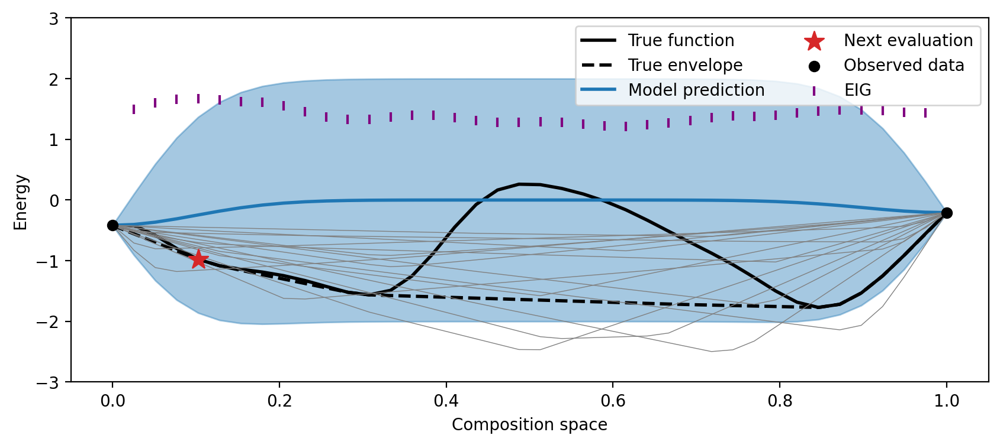

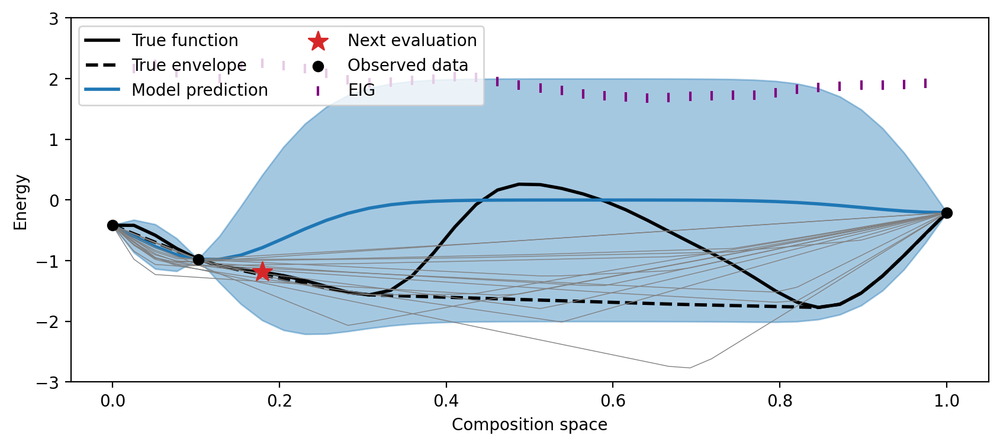

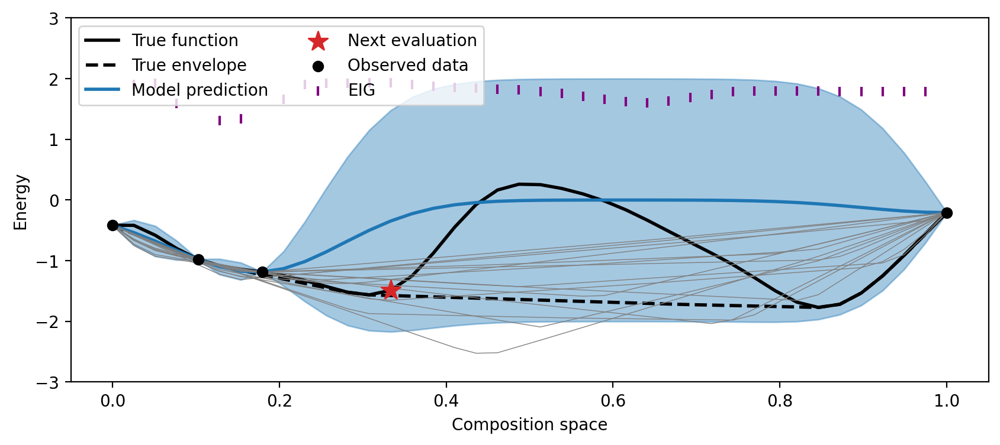

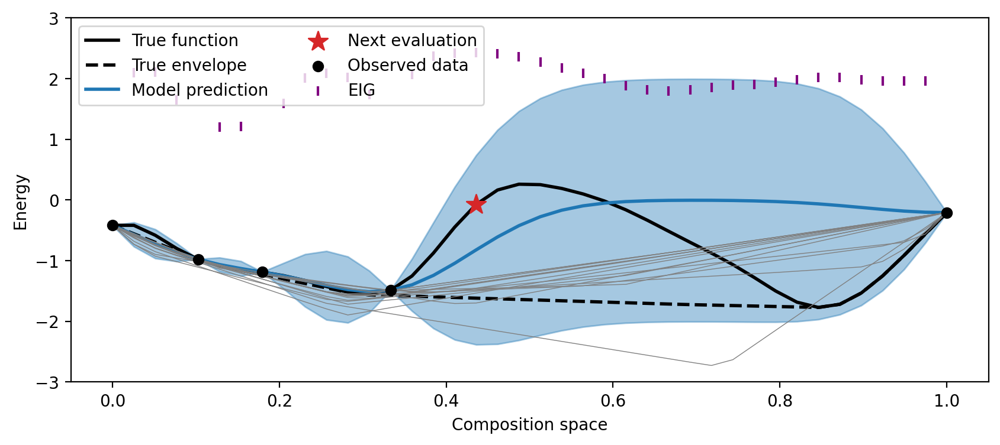

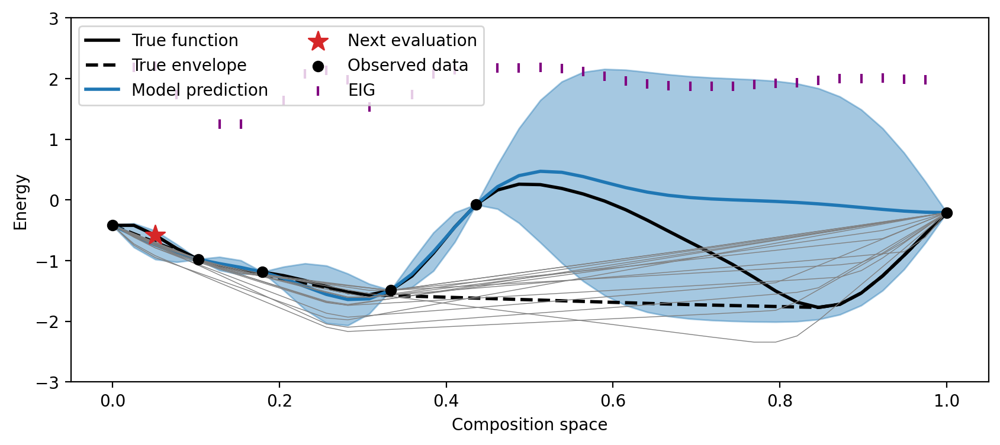

...

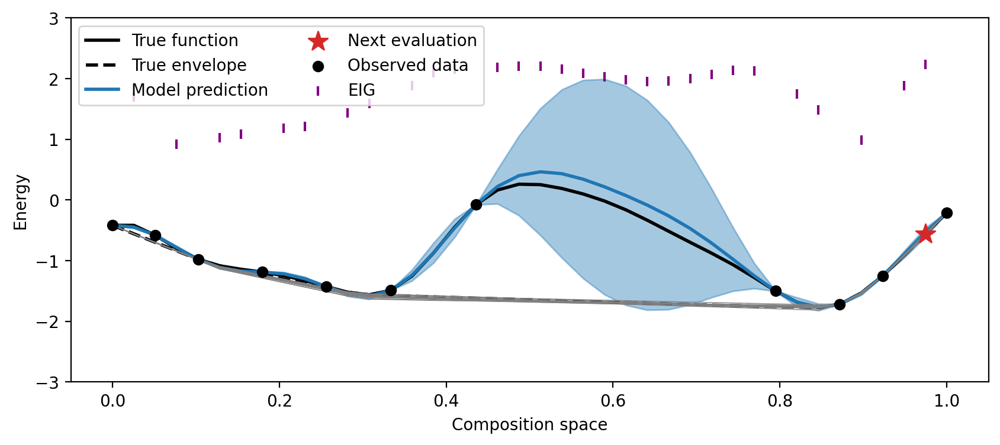

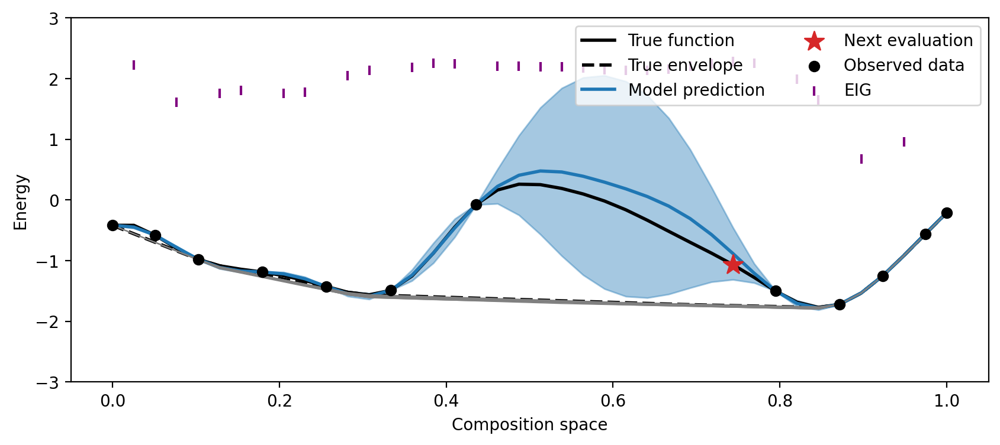

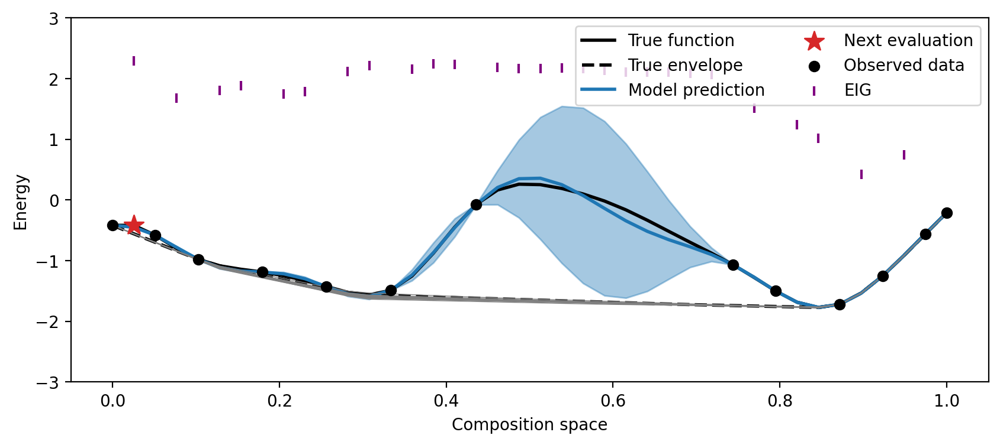

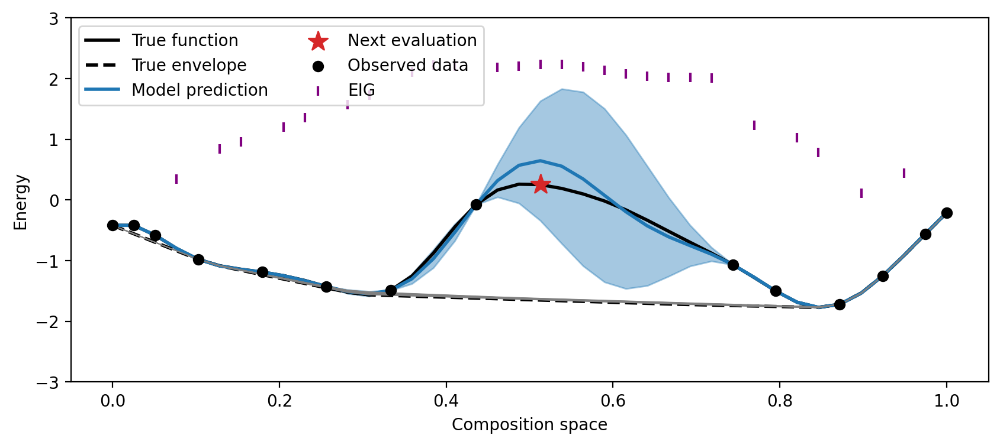

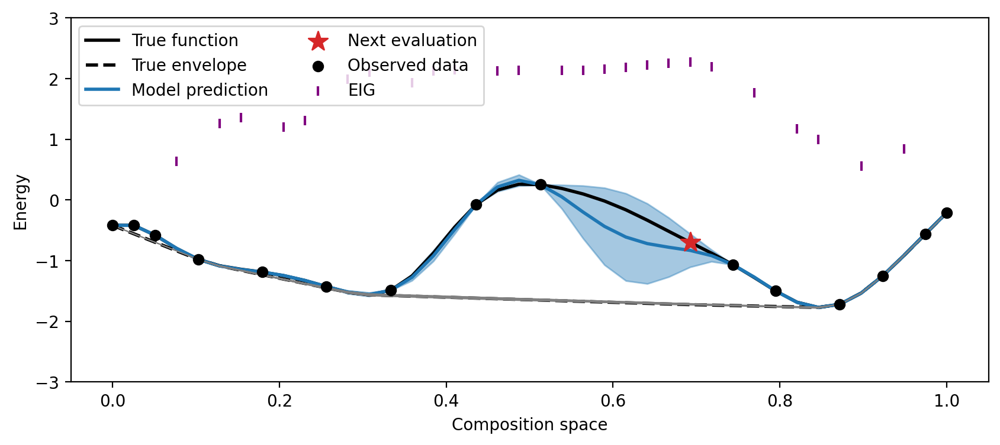

In [41]:
seed = 2
num_iters = 14
knot_N = 40
npr.seed(seed); rng_key = jrnd.PRNGKey(1)

# grid to discretize design space into
knot_x = jnp.linspace(0, 1, knot_N)
design_space = knot_x[:, jnp.newaxis]

true_y, true_envelope = generate_true_function(design_space, knot_N)

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([design_space[0], design_space[-1]]); train_y = jnp.array([true_y[0], true_y[-1]])
#data = (train_x, train_y) # TODO: get rid of this eventually
dataset = Dataset(X=train_x, y=train_y[:,jnp.newaxis])

#designs = design_space
designs = design_space[1:-1]
# update model
pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)

#print(pred_mean)
#print(pred_cov)

for i in range(num_iters):
    print("Iteration: ", i)
    
    %time next_x, entropy_change = get_next_candidate_gpjax(posterior, params, dataset, designs, design_space, rng_key, T=50, J=50)
    print(next_x, entropy_change)
    
    _, envelopes, _ = sample_from_posterior(pred_mean, pred_cov, design_space, 15)
    #plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, dataset, next_x, entropy_change, plot_eig=True, plot_hulls=True)
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, dataset, next_x, entropy_change, plot_eig=True, plot_hulls=True, designs=designs)

    # add observations to data and update list of designs
    dataset = dataset + Dataset(X=jnp.atleast_2d(next_x), y=jnp.atleast_2d(get_next_y(true_y, design_space, next_x)))
    
    designs = jnp.delete(designs, (designs == next_x).argmax())[:, jnp.newaxis]
    
    # update model
    pred_mean, pred_cov, posterior, params = update_model_gpjax(dataset, design_space, rng_key, update_params=False)
    
    #print(pred_mean)
    #print(pred_cov)


In [ ]:
#####





In [288]:
len(pred_mean)

40

In [220]:
%time next_x, entropy_change = get_next_candidate_gpjax(posterior, params, dataset, designs, design_space, rng_key, T=50, J=50)

CPU times: user 21.4 s, sys: 300 ms, total: 21.7 s
Wall time: 18.8 s


In [289]:
params

{'kernel': {'lengthscale': Array([0.1], dtype=float64),
  'variance': Array([1], dtype=int64)},
 'mean_function': {},
 'likelihood': {'obs_noise': Array([0], dtype=int64)}}

In [265]:
jnp.delete(designs, (designs == next_x).argmax())

Array([0.15384615, 0.17948718, 0.20512821, 0.23076923, 0.25641026,
       0.28205128, 0.30769231, 0.33333333, 0.35897436, 0.38461538,
       0.41025641, 0.43589744, 0.46153846, 0.48717949, 0.51282051,
       0.53846154, 0.56410256, 0.58974359, 0.61538462, 0.64102564,
       0.66666667, 0.69230769, 0.71794872, 0.74358974, 0.76923077,
       0.79487179, 0.82051282, 0.84615385, 0.87179487, 0.8974359 ,
       0.92307692, 0.97435897], dtype=float64)

In [266]:
designs

Array([0.12820513, 0.15384615, 0.17948718, 0.20512821, 0.23076923,
       0.25641026, 0.28205128, 0.30769231, 0.33333333, 0.35897436,
       0.38461538, 0.41025641, 0.43589744, 0.46153846, 0.48717949,
       0.51282051, 0.53846154, 0.56410256, 0.58974359, 0.61538462,
       0.64102564, 0.66666667, 0.69230769, 0.71794872, 0.74358974,
       0.76923077, 0.79487179, 0.82051282, 0.84615385, 0.87179487,
       0.8974359 , 0.92307692, 0.97435897], dtype=float64)

Iteration:  0
CPU times: user 26 s, sys: 722 ms, total: 26.7 s
Wall time: 25.4 s
[0.17948718] [-1.39252904  1.5356039   1.57915427  1.60806923  1.59354027  1.59483206
  1.62324906  1.66742411  1.66507393  1.607285    1.50627622  1.43909905
  1.41023243  1.43276387  1.47508177  1.50033487  1.48670027  1.44530038
  1.40218123  1.37960327  1.37171045  1.34123164  1.27904873  1.21580582
  1.17437056  1.15914299  1.16796485  1.19192964  1.21868947  1.2701816
  1.32843211  1.3969783   1.46592511  1.50087726  1.49883209  1.47122212
  1.42459899  1.39610704  1.39437856 -0.99108253]
Iteration:  1
CPU times: user 25 s, sys: 354 ms, total: 25.3 s
Wall time: 22 s
[0.1025641] [-1.62991567  2.01192329  2.10211069  2.16343522  2.19136471  2.1687527
  1.94176211 -2.50650543  1.91323399  2.08750664  2.04292214  1.96743325
  1.90081783  1.83725921  1.79999323  1.75565005  1.71242093  1.68449104
  1.65117756  1.6087473   1.58388547  1.57316138  1.57503565  1.58140367
  1.59868085  1.63418412  1.63631885 

Array(0.54822612, dtype=float64)

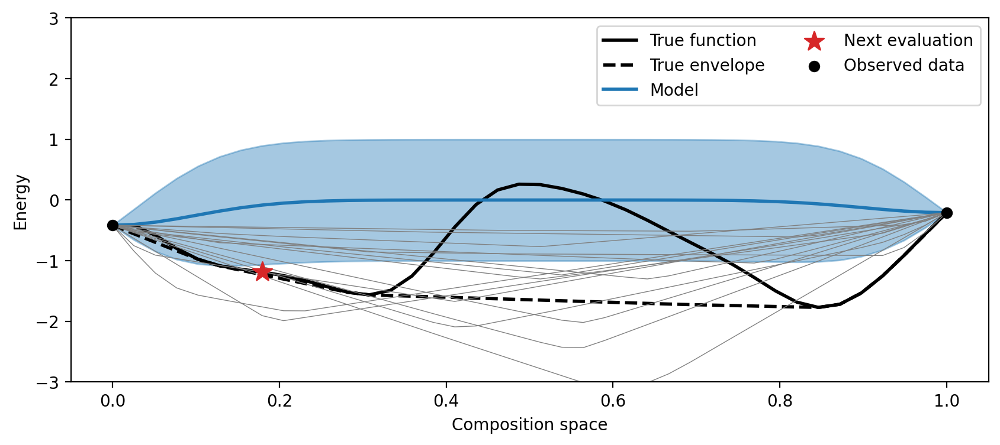

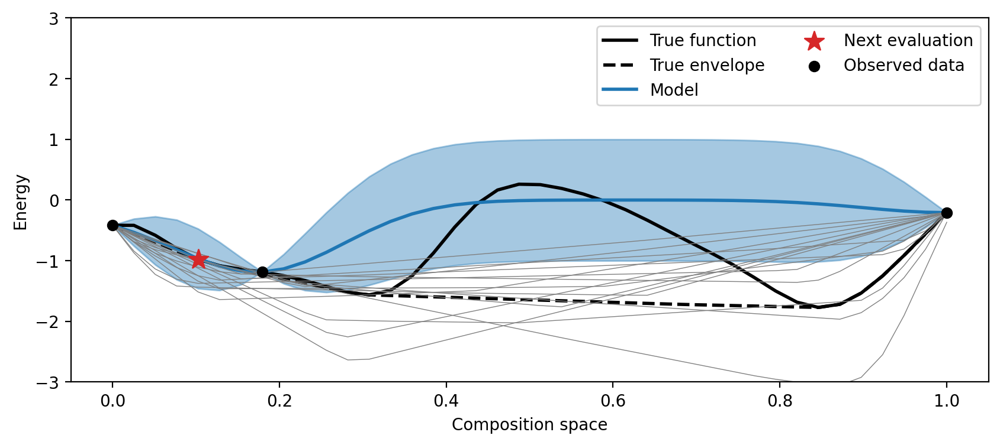

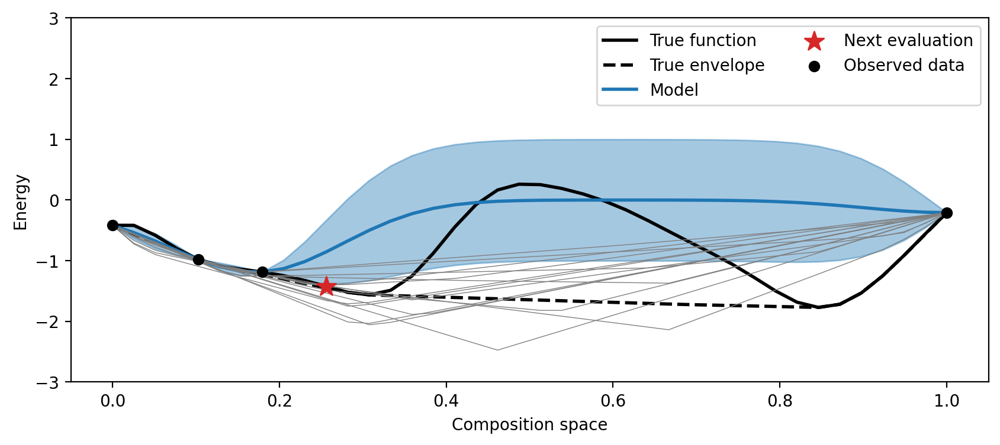

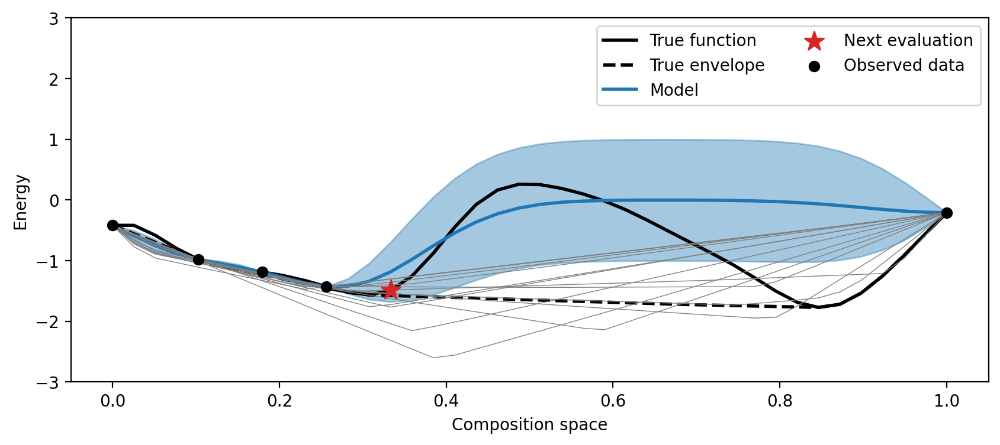

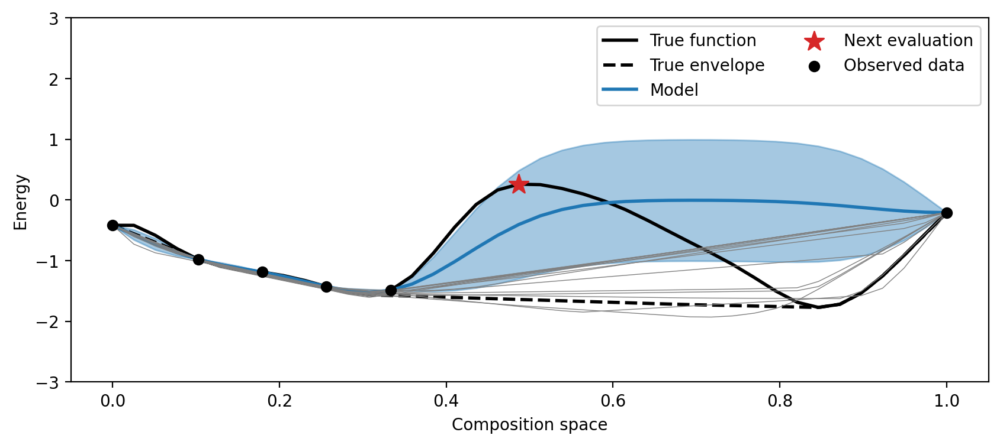

...

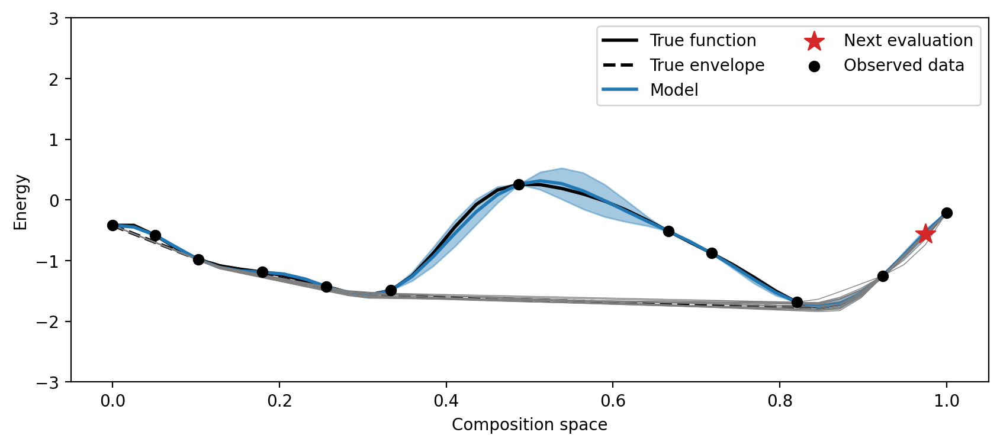

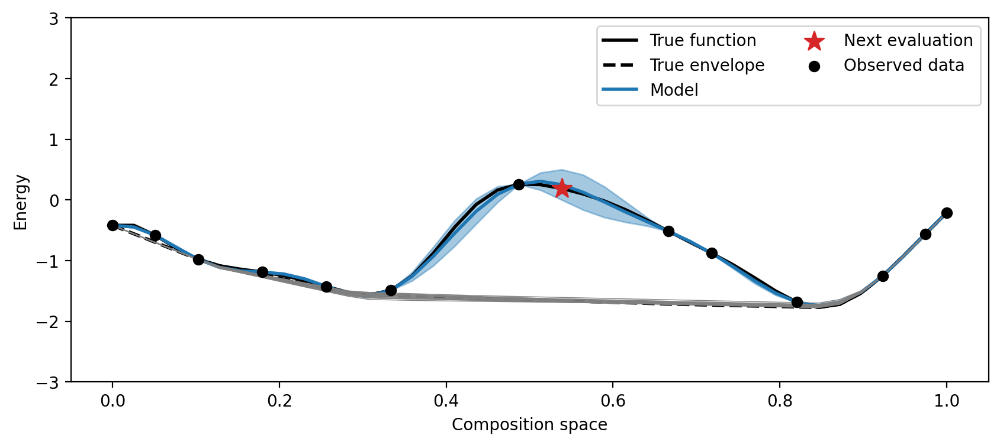

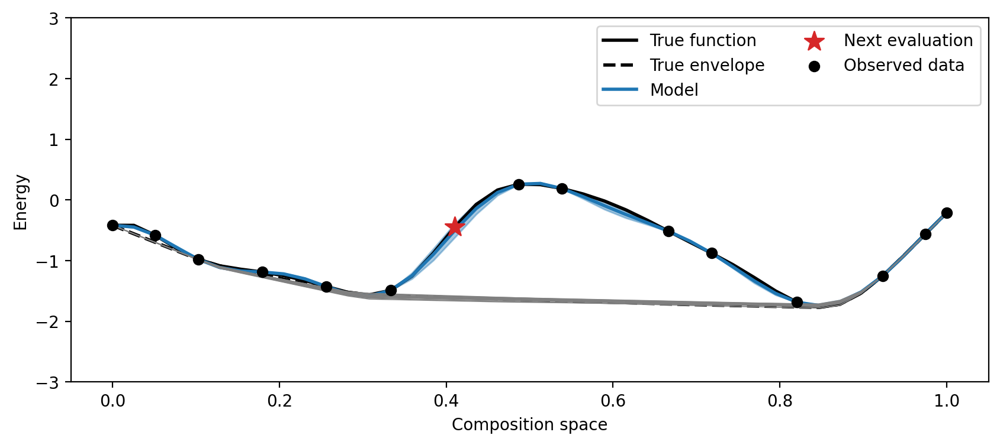

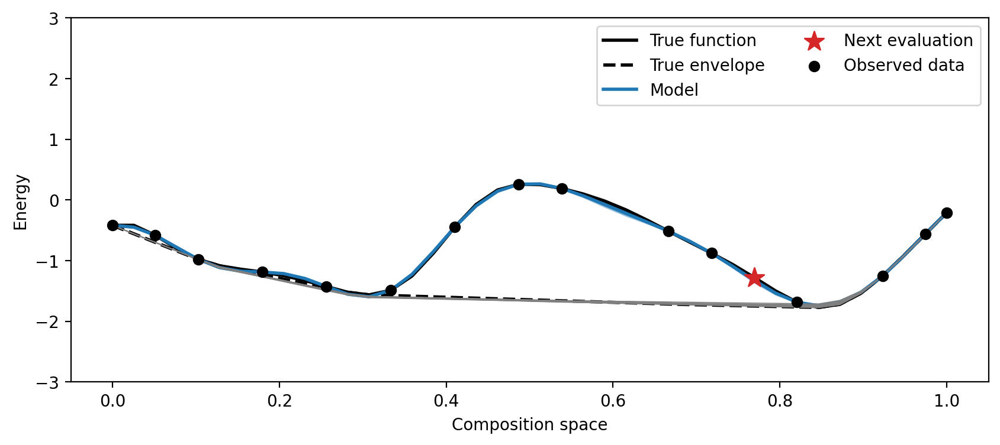

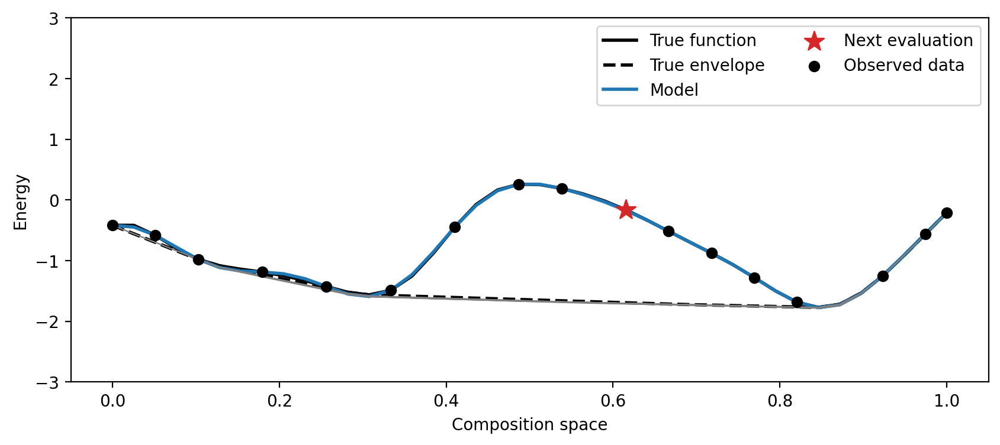

In [16]:
# Set random seed
seed = 2
npr.seed(seed); rng_key = jrnd.PRNGKey(1) # old seed for latter was 1

num_iters = 15

# maintain an array of indicies of the design-space to look at that haven't yet been observed
#design_inds = jnp.array(range(1, knot_N-1))  # include all but endpoints in initial design indicies
design_inds = jnp.array(range(knot_N)) # for now just compute IG for every index

# grid to discretize design space into
knot_x = jnp.linspace(0, 1, knot_N)
design_space = knot_x[:, jnp.newaxis]

true_y, true_envelope = generate_true_function(design_space, knot_N)

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([design_space[0], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
#dataset = gpx.Dataset(X=train_x, y=train_y[:,jnp.newaxis])


pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space)
#print(pred_mean)
#print(pred_cov)


for i in range(num_iters):
    print("Iteration: ", i)
    %time next_x, entropy_change = get_next_candidate(data, design_inds, design_space, rng_key, T=50, J=50)
    print(design_space[next_x], entropy_change) 
    
    # plot model and suggested candidate configuration
    plot_candidate_old(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data and remove from list of designs to look at 
    data = add_observation(data, true_y, next_x, design_space, design_inds)
    #print(next_x); print(design_inds)
    #design_inds = jnp.delete(design_inds, next_x) # note: next_x is the index in the design_inds array, not the original design_space
    
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space) 
    
    #print(pred_mean)
    #print(pred_cov)

    
distances = compute_distances(data, true_envelope)
distances.mean()

In [205]:
entropy_change

Array([-1.39252904,  1.5356039 ,  1.57915427,  1.60806923,  1.59354027,
        1.59483206,  1.62324906,  1.66742411,  1.66507393,  1.607285  ,
        1.50627622,  1.43909905,  1.41023243,  1.43276387,  1.47508177,
        1.50033487,  1.48670027,  1.44530038,  1.40218123,  1.37960327,
        1.37171045,  1.34123164,  1.27904873,  1.21580582,  1.17437056,
        1.15914299,  1.16796485,  1.19192964,  1.21868947,  1.2701816 ,
        1.32843211,  1.3969783 ,  1.46592511,  1.50087726,  1.49883209,
        1.47122212,  1.42459899,  1.39610704,  1.39437856, -0.99108253],      dtype=float64)

In [224]:
entropy_change ## new one

Array([1.57078965, 1.59666226, 1.59881658, 1.59577419, 1.59151064,
       1.59526524, 1.57418753, 1.50798423, 1.42436409, 1.34520645,
       1.28908246, 1.28455935, 1.32334133, 1.3609732 , 1.39162019,
       1.37232343, 1.32440736, 1.28676901, 1.28768763, 1.3069691 ,
       1.29614688, 1.26254353, 1.20135994, 1.14519433, 1.12097462,
       1.13597443, 1.17912585, 1.2432698 , 1.31768394, 1.35288777,
       1.38585423, 1.43588794, 1.47207842, 1.49940112, 1.51051826,
       1.50864324, 1.49895538, 1.47386762], dtype=float64)

Iteration:  0


ValueError: x and y must be the same size

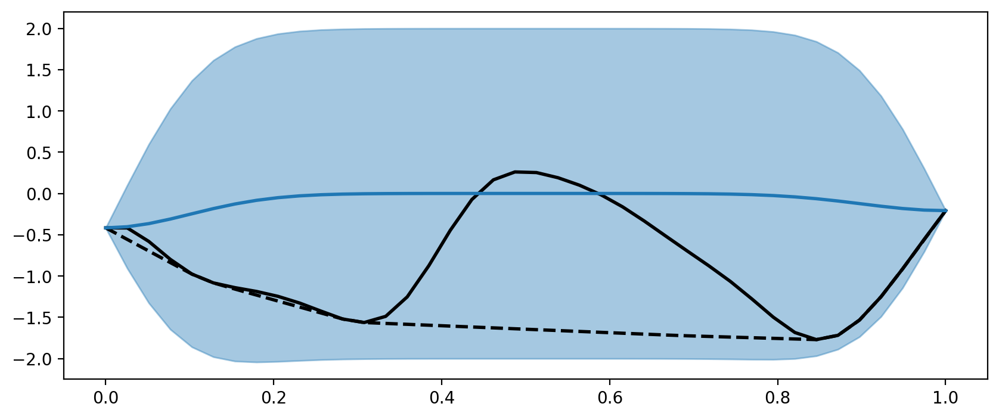

In [13]:
###  baseline
num_iters = 9
npr.seed(2)

# grid to discretize design space into
knot_x = jnp.linspace(0, 1, knot_N)
design_space = knot_x[:, jnp.newaxis]

true_y, true_envelope = generate_true_function(design_space, knot_N)

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([design_space[0], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, design_space, design_space)
    #print(entropy_change)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x, design_space, design_inds)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

In [88]:
# Define some global variables

# Number of points to discretize the space into
knot_N = 40
# grid to discretize design space into
knot_x = jnp.linspace(0, 1, knot_N)

In [ ]:
make

In [42]:
# Set random seed
npr.seed(2)
# Length scale for the kernel
ls = 0.1
true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

rng_key = jrnd.PRNGKey(1)

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances = compute_distances(data, true_envelope)
distances.mean()

NameError: name 'kernel' is not defined

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8


DeviceArray(0.51340004, dtype=float64)

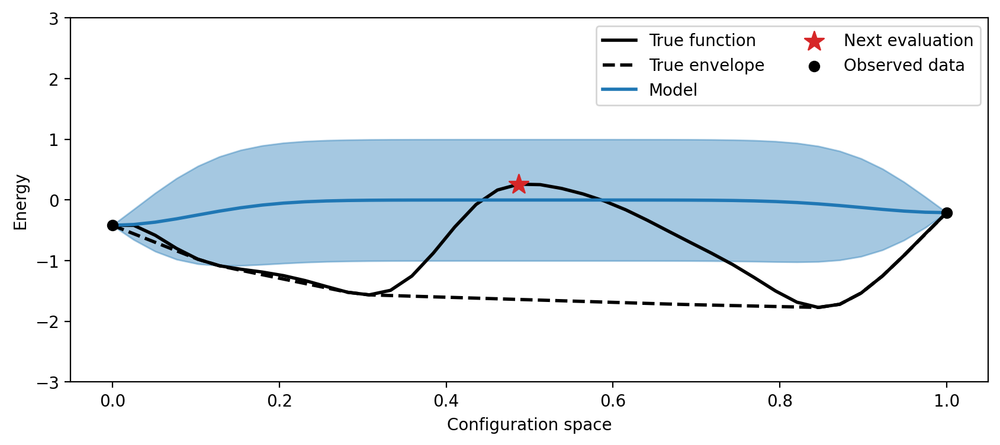

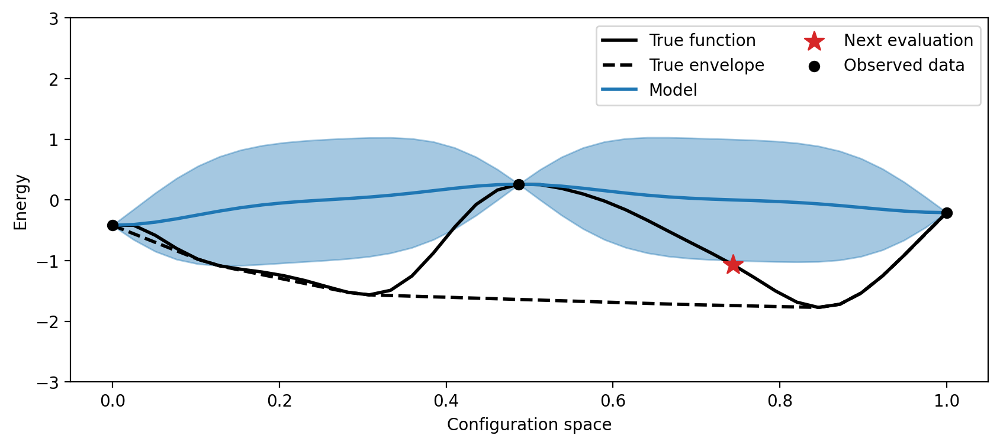

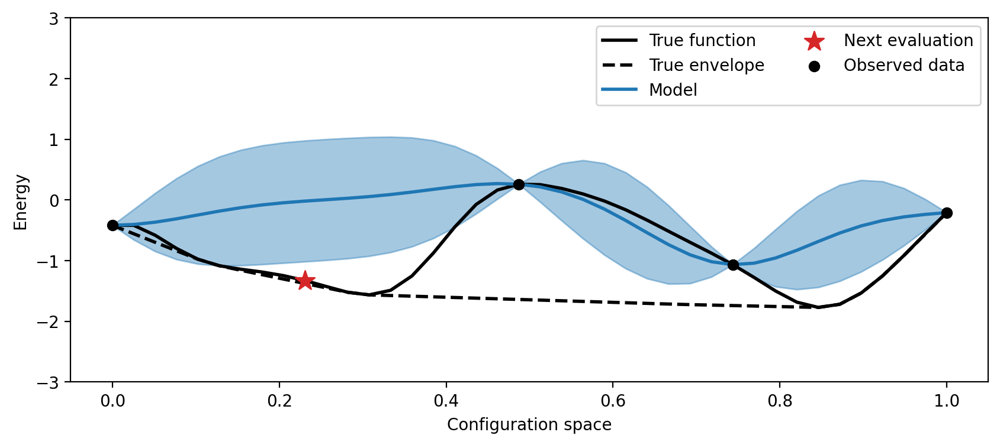

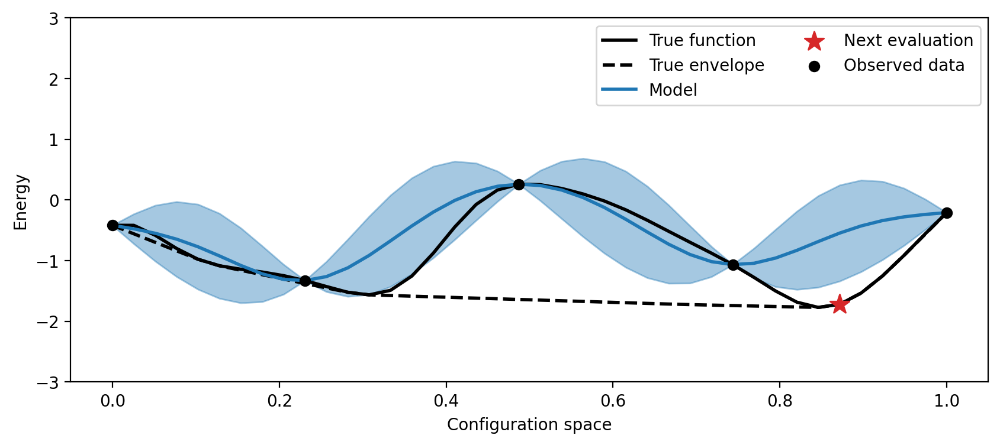

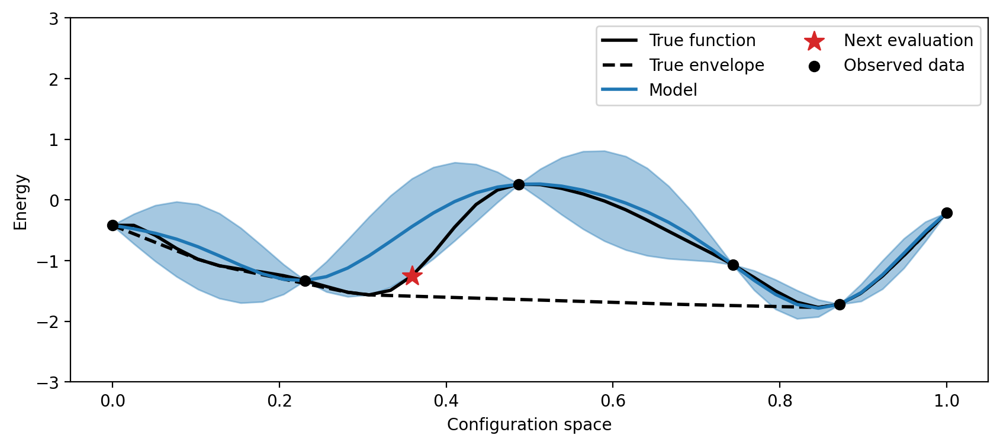

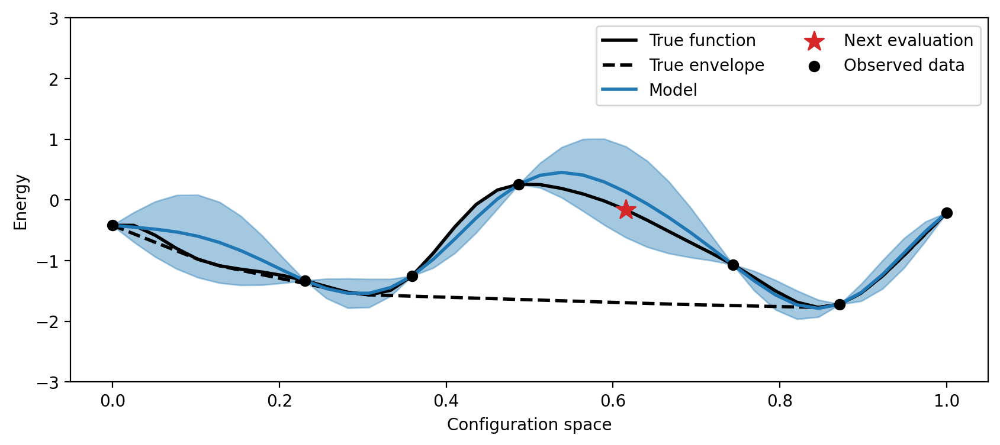

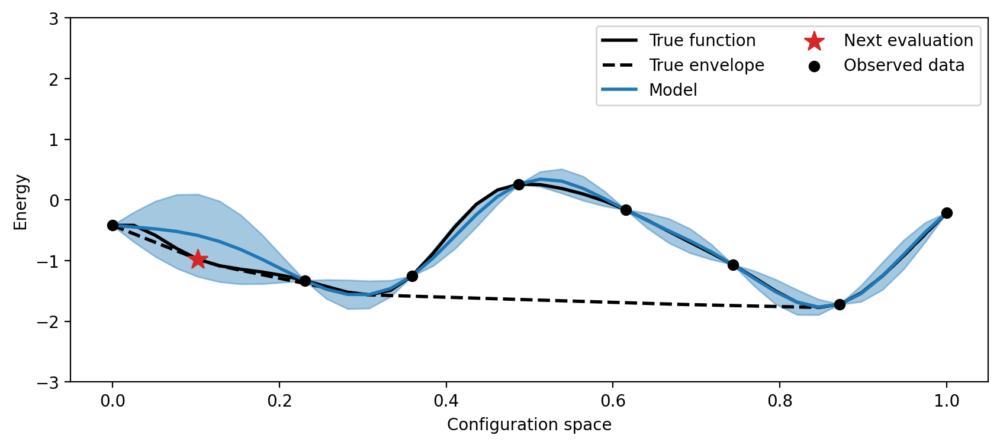

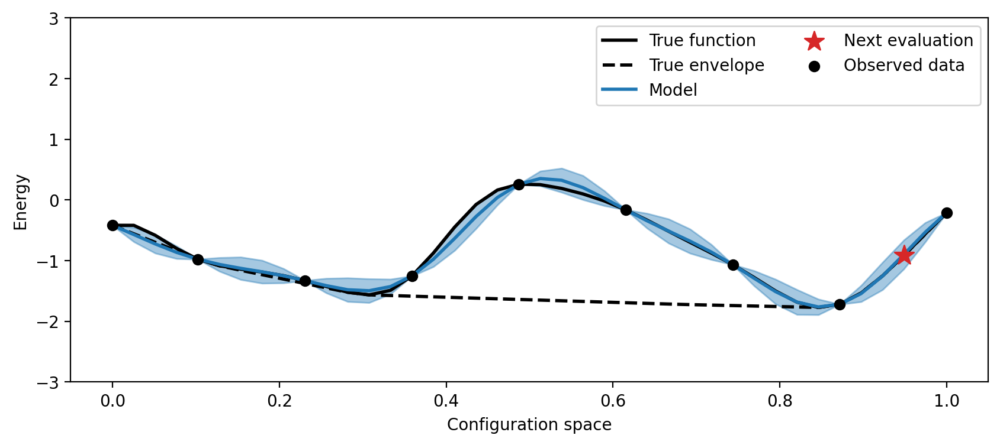

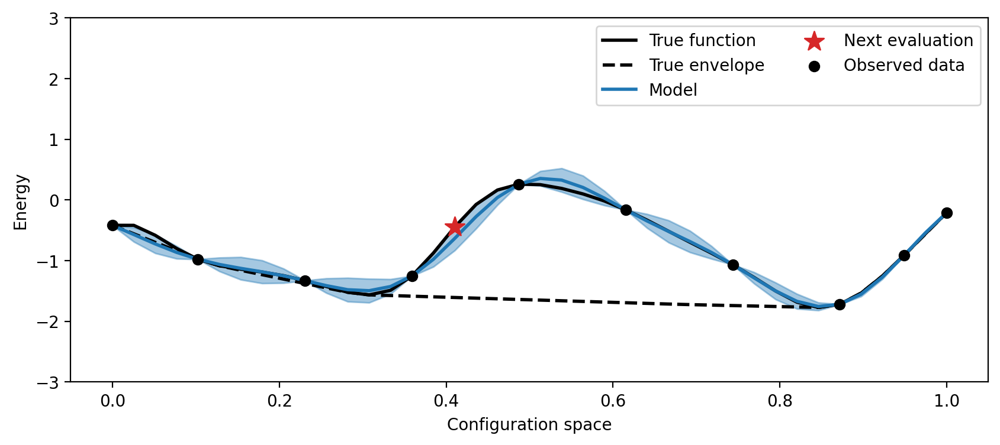

In [81]:
###  baseline

num_iters = 9

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


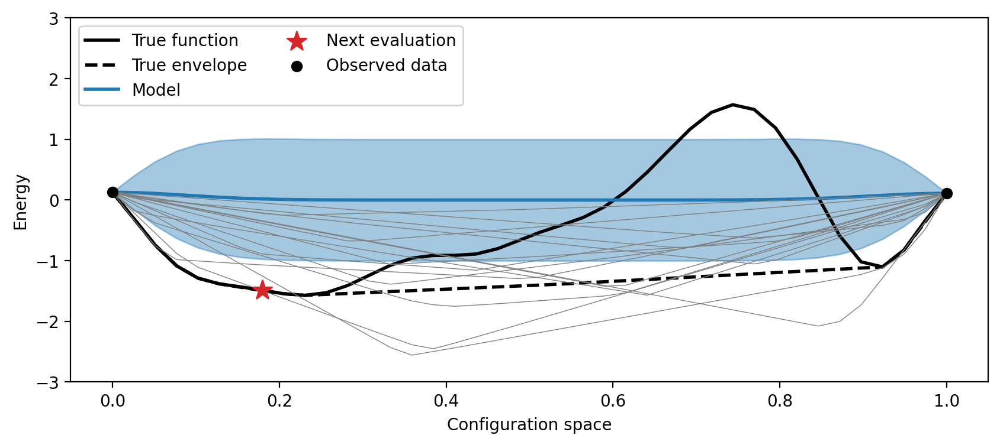

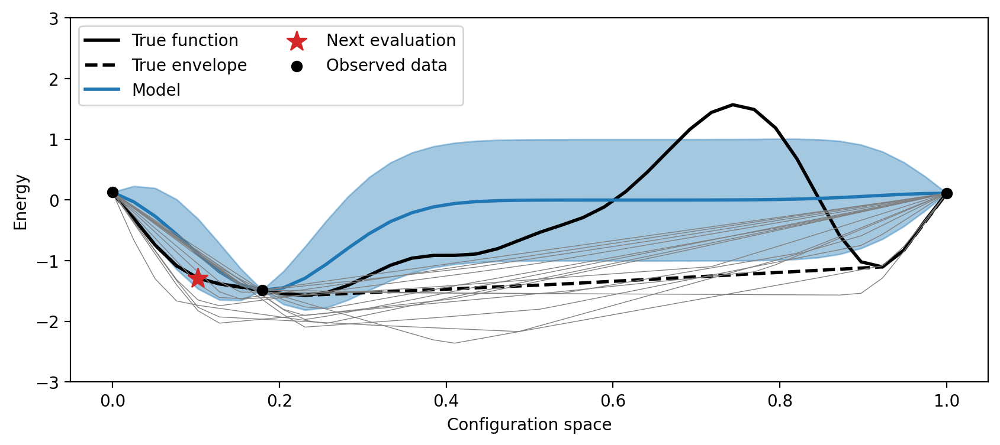

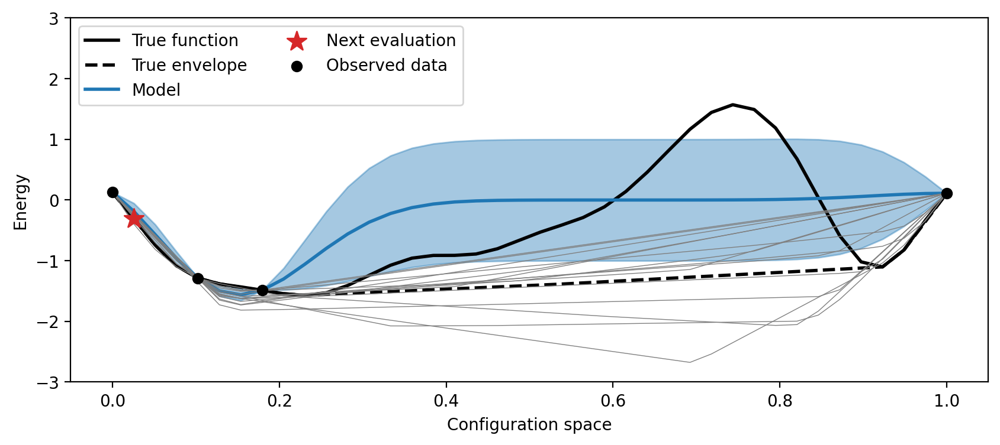

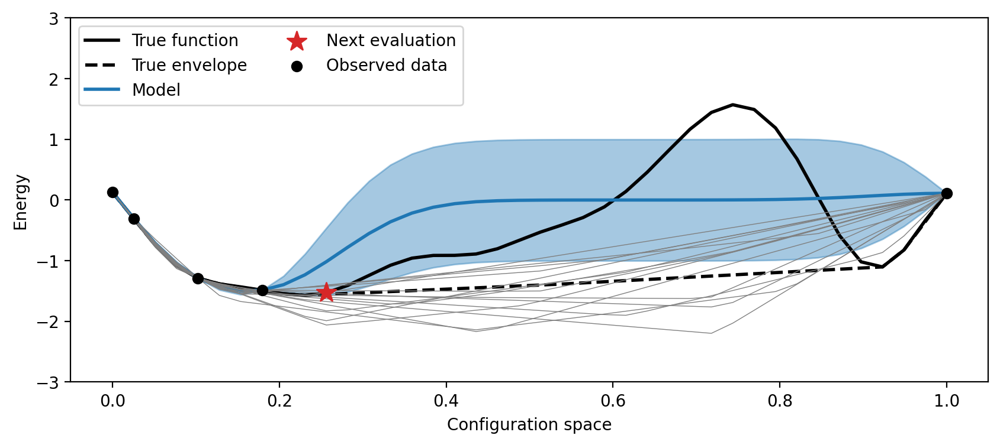

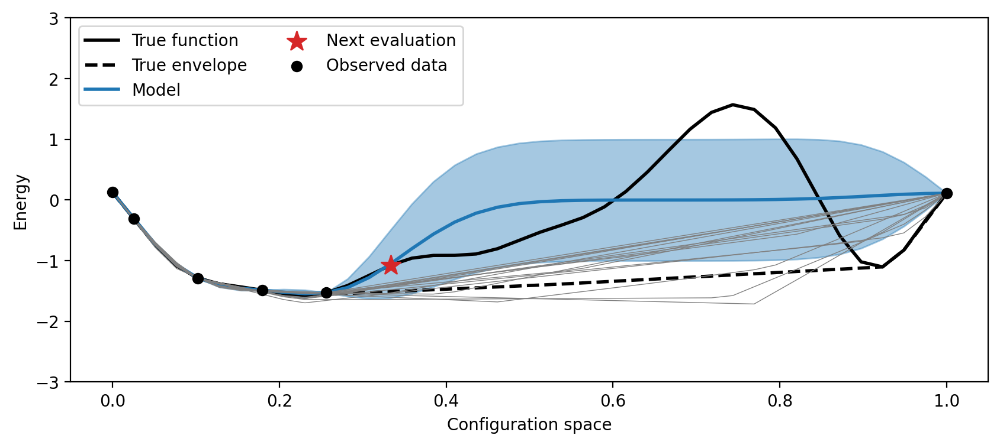

...

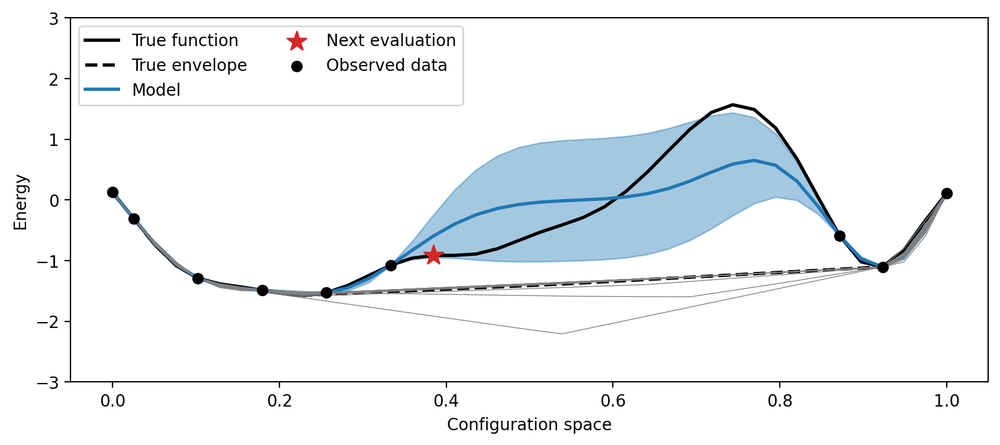

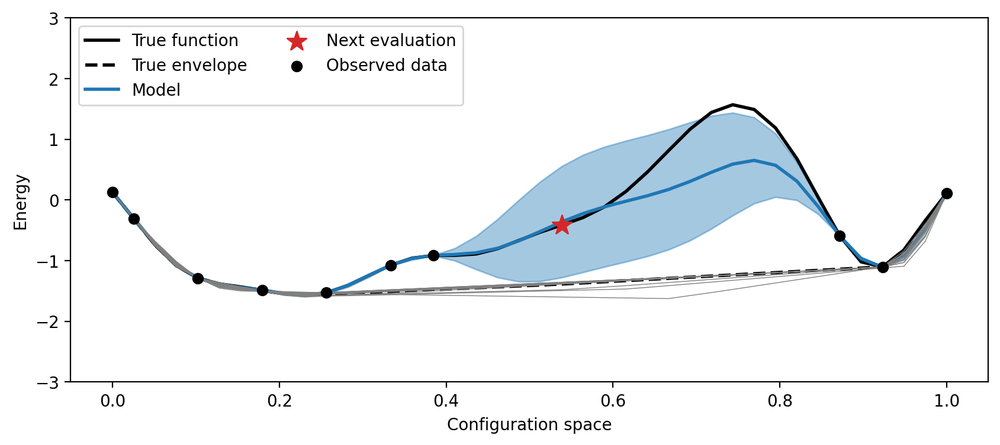

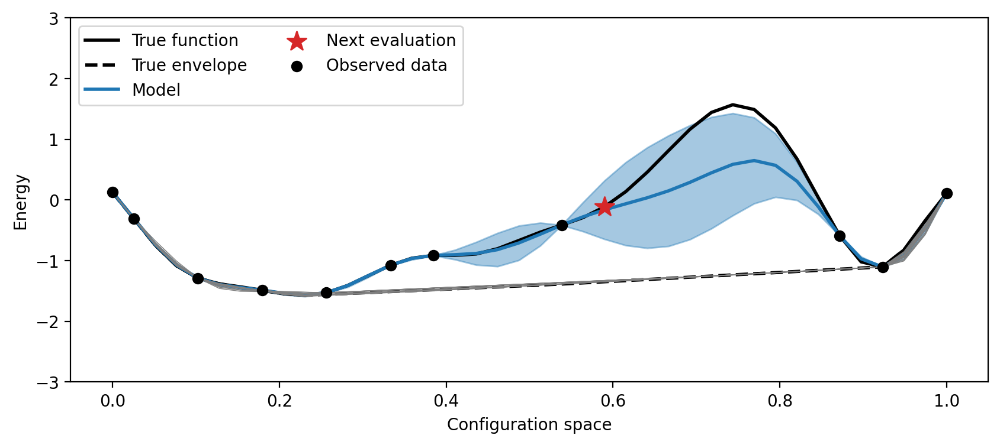

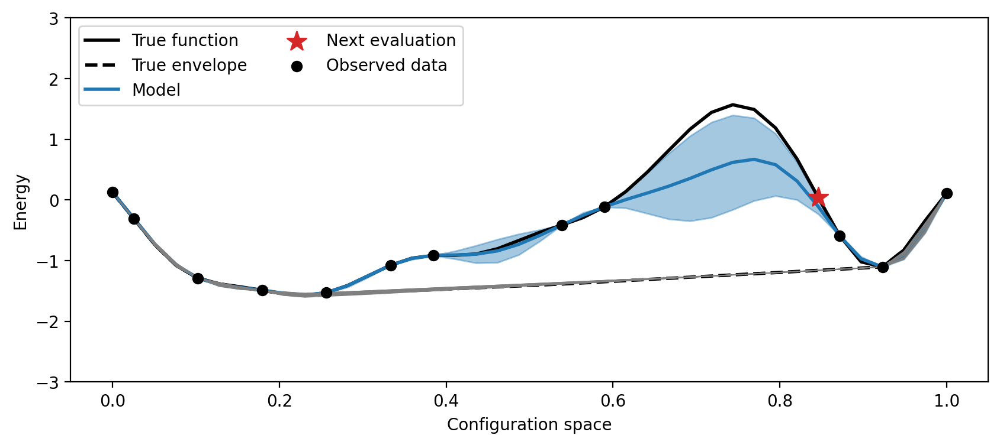

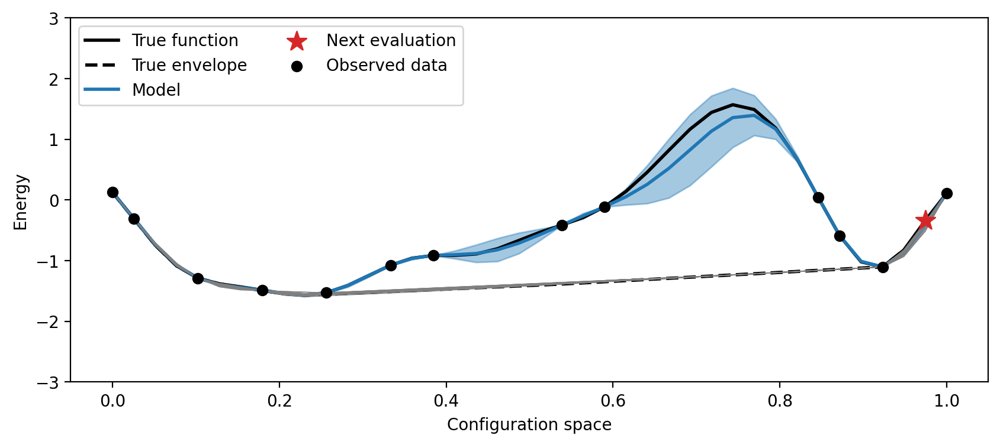

In [8]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


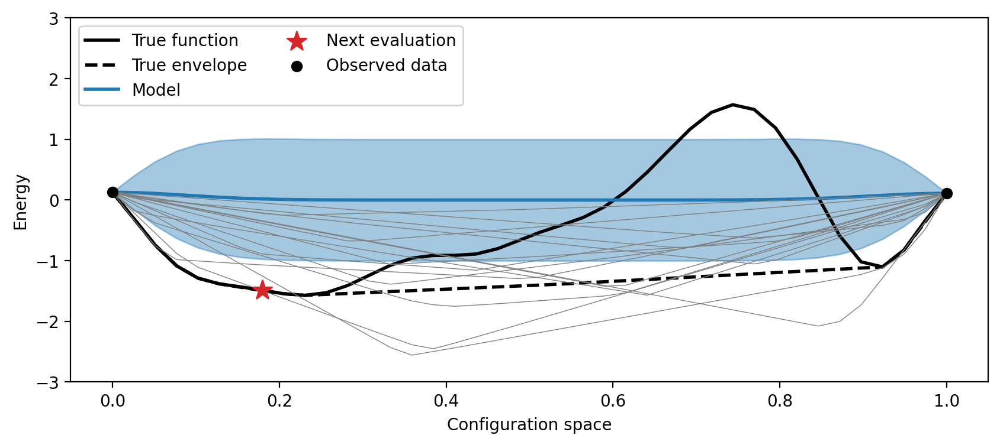

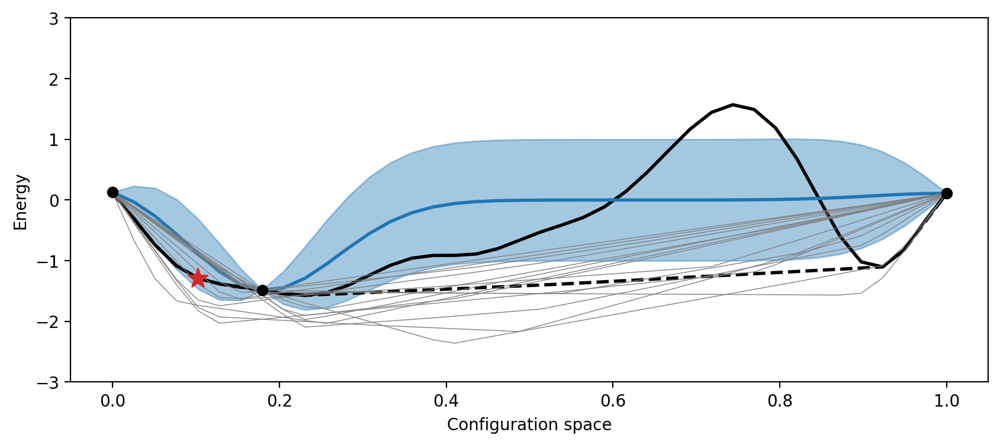

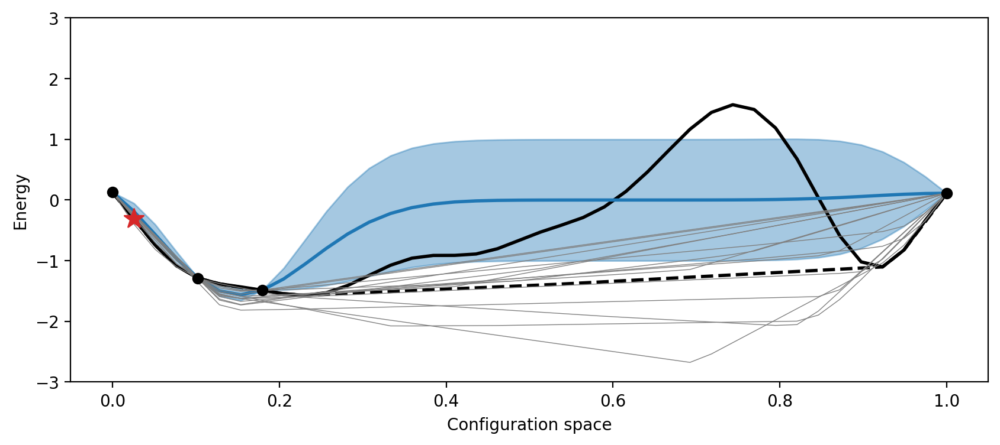

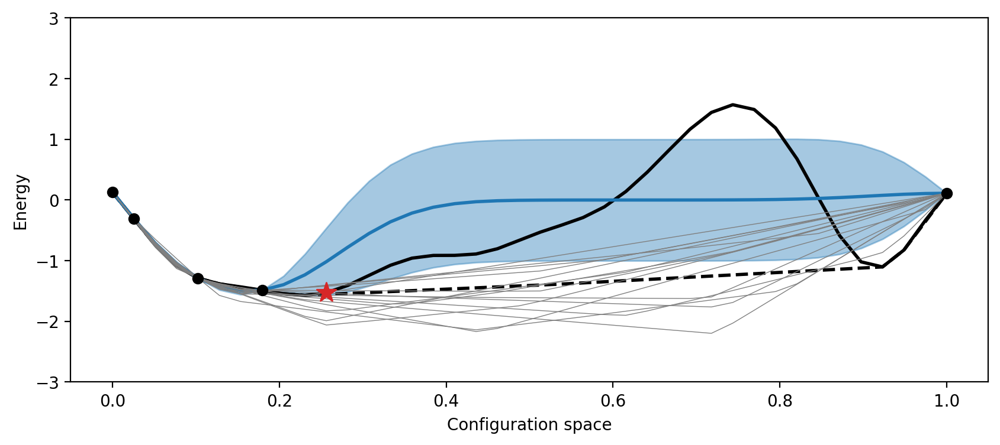

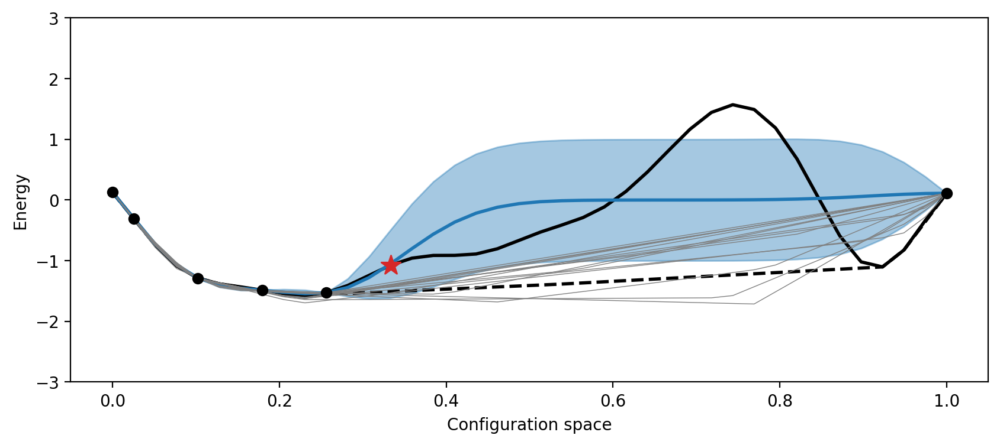

...

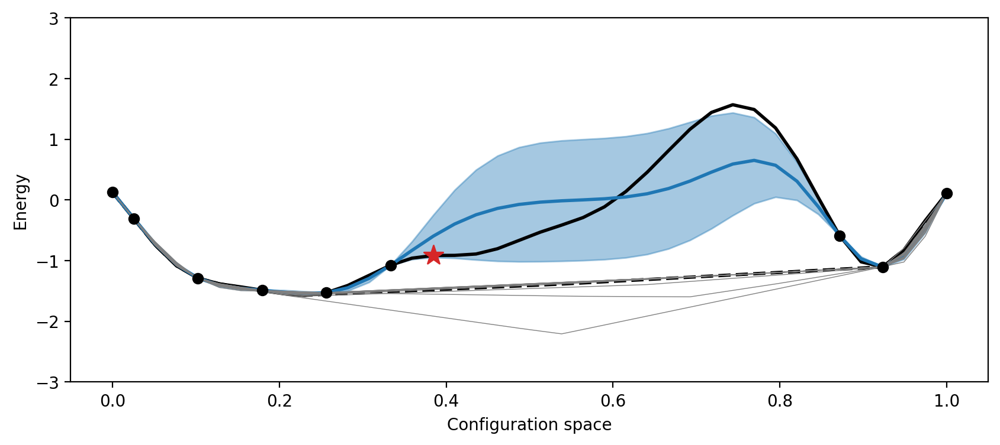

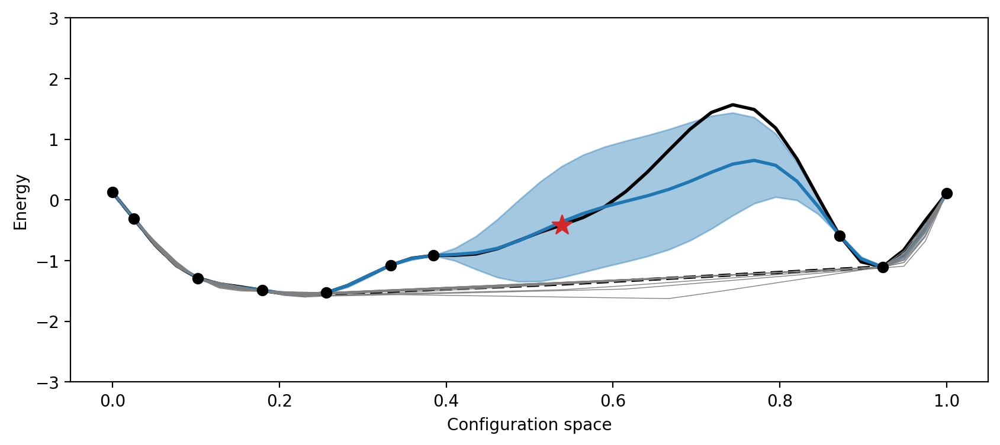

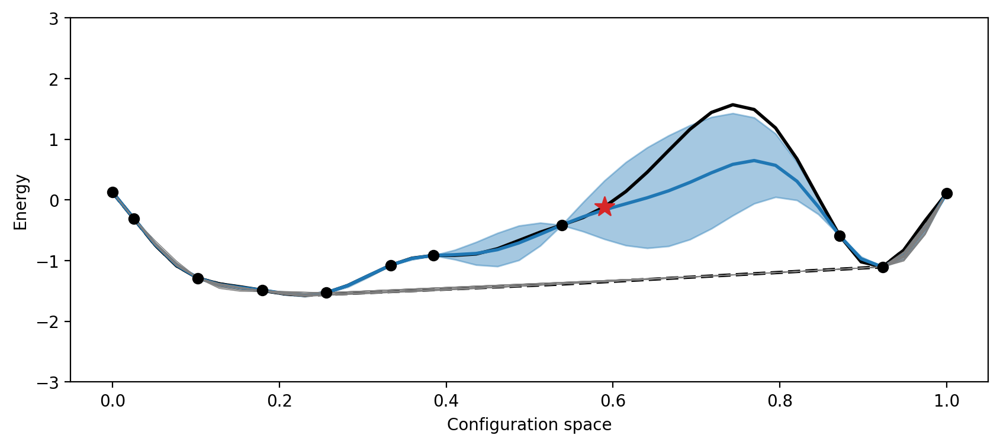

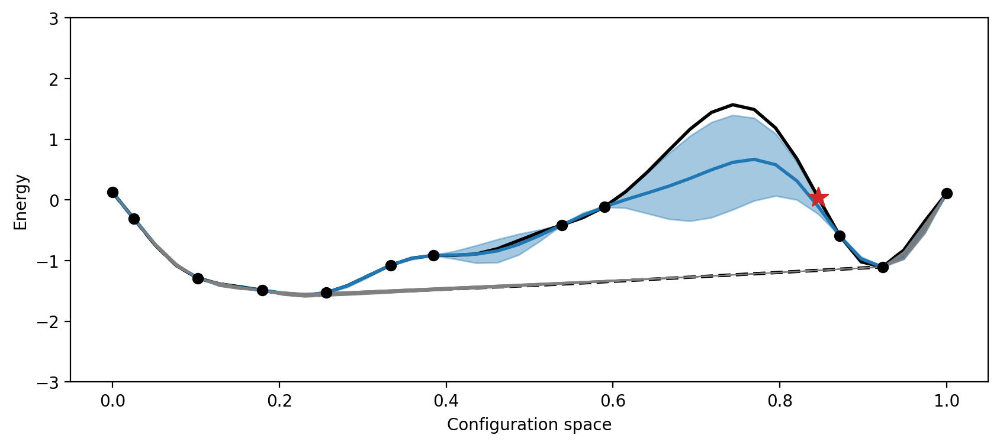

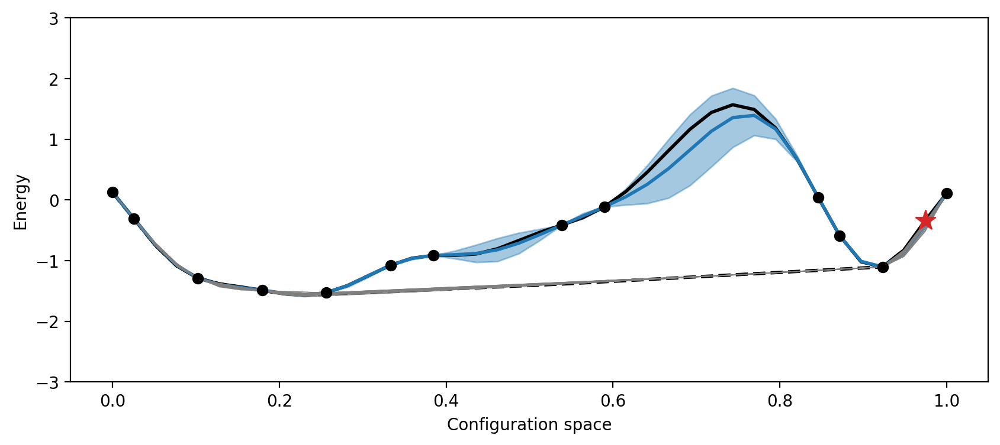

In [17]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, legend=plot_legend)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6
Iteration:  7
Iteration:  8
Iteration:  9
Iteration:  10
Iteration:  11


DeviceArray(0.66023888, dtype=float64)

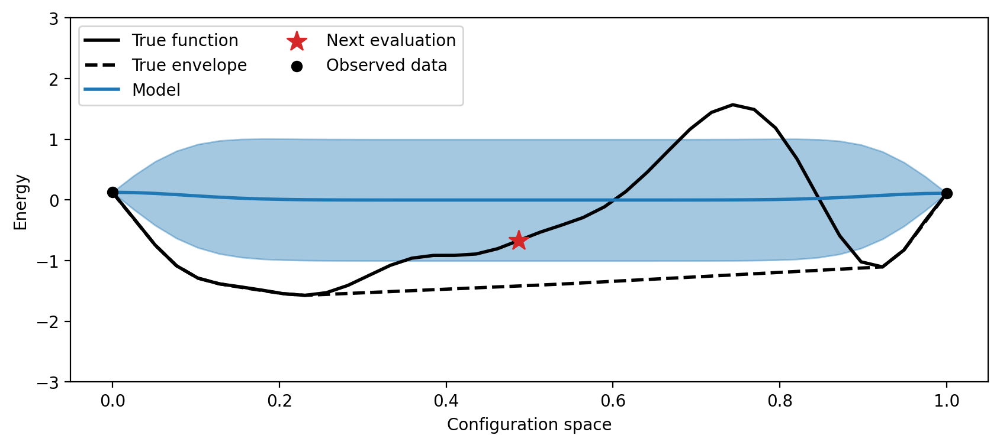

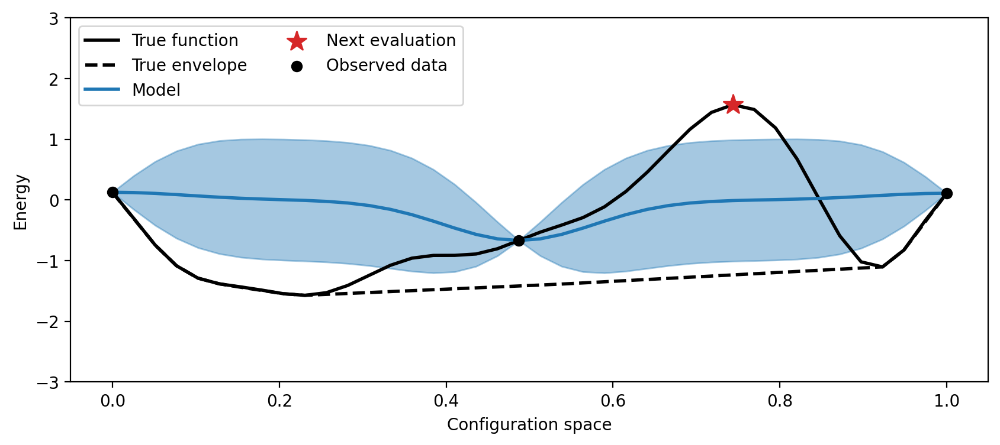

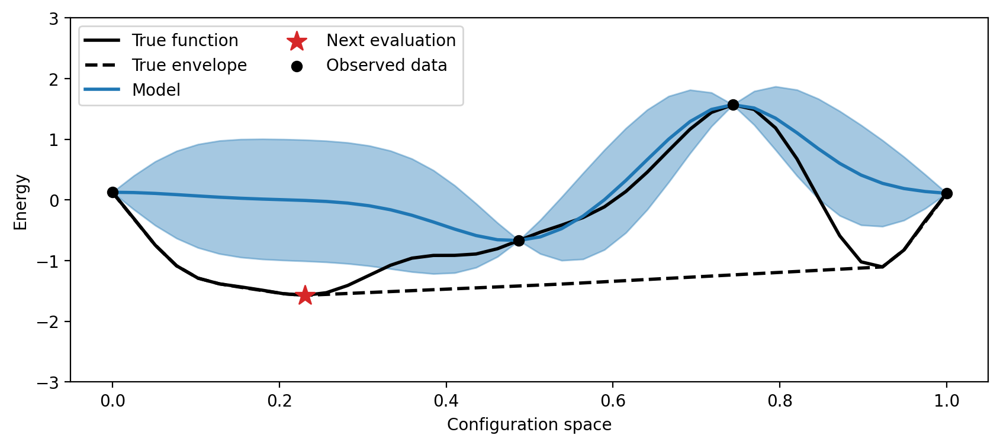

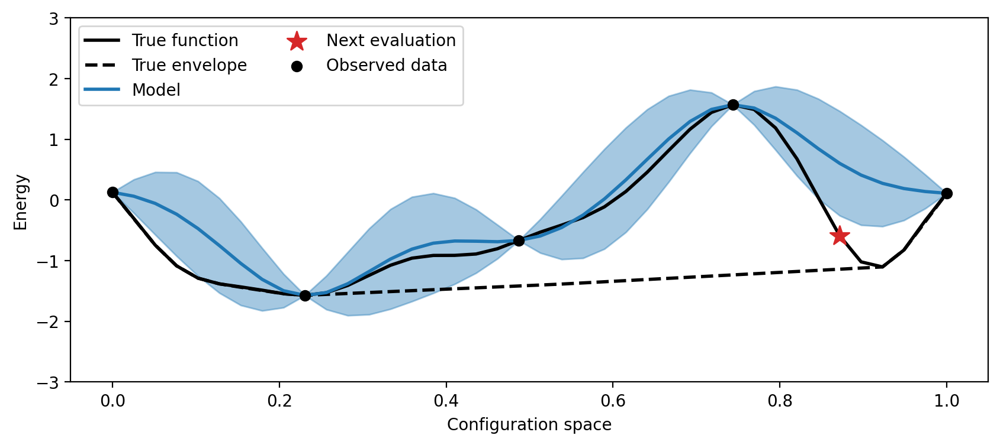

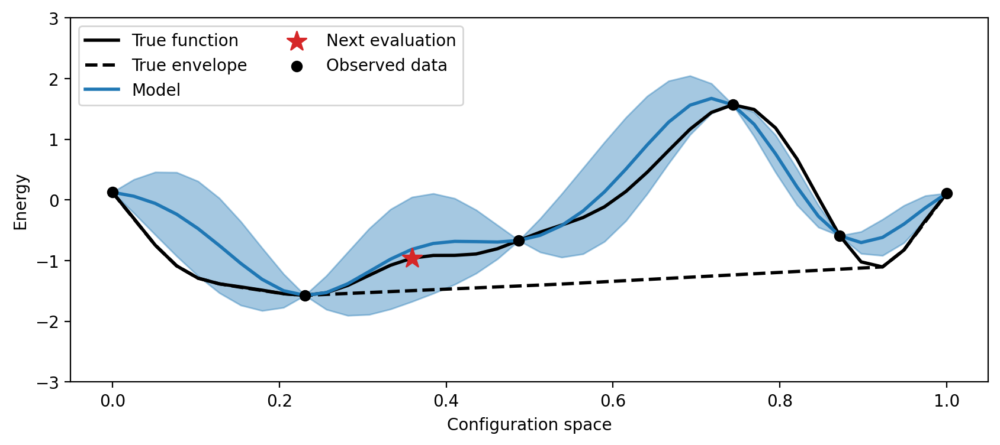

...

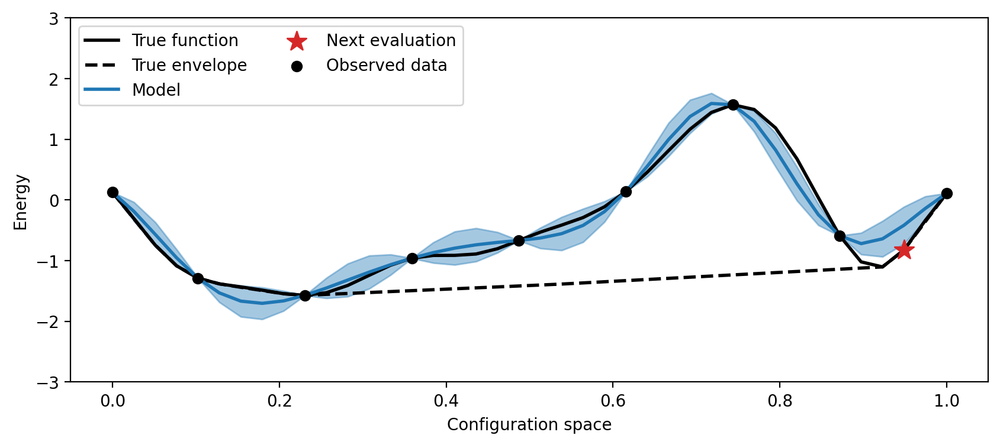

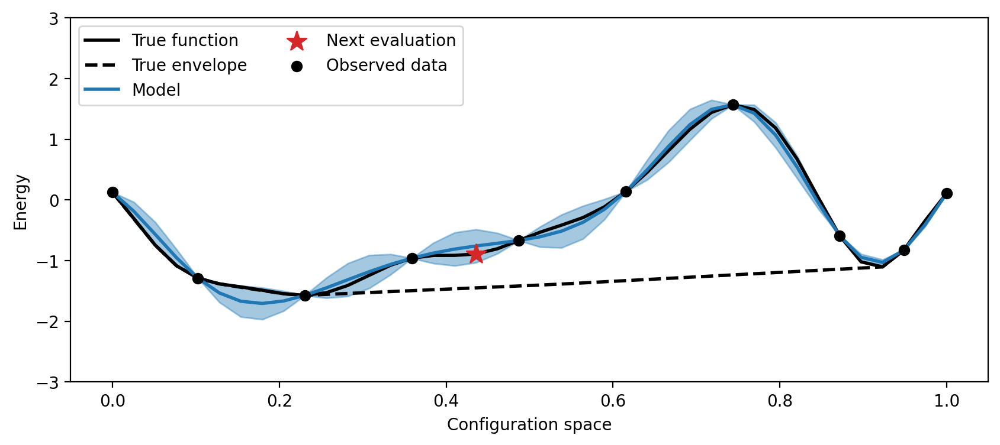

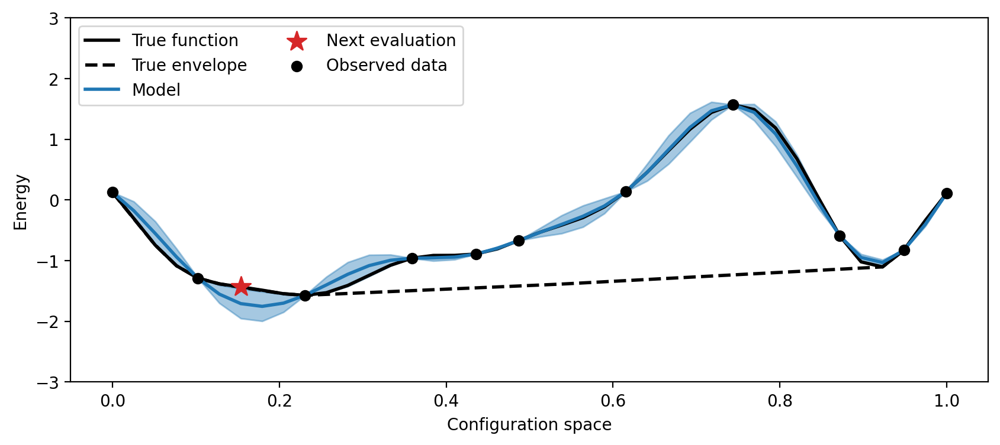

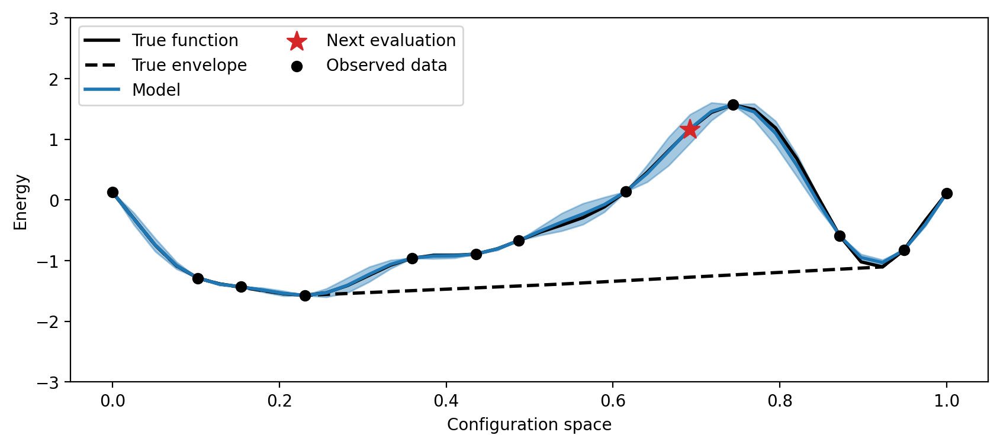

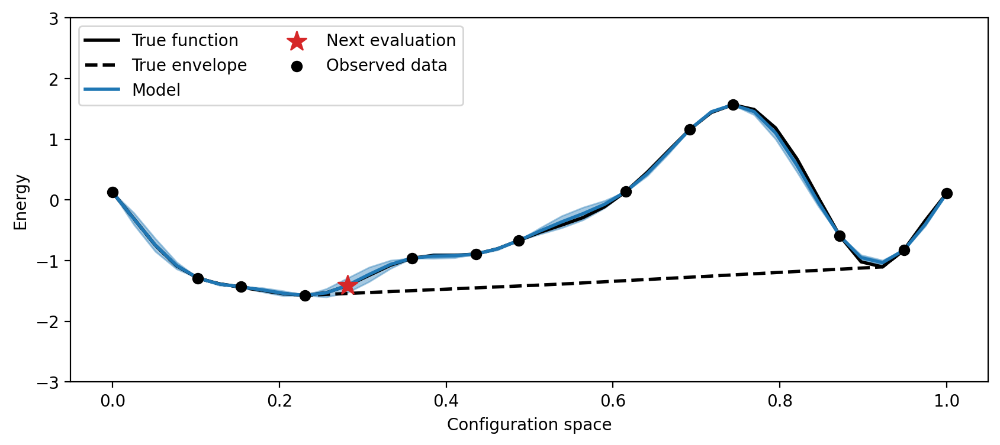

In [82]:
###  baseline

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 12

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate_baseline(data, knot_x)
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False, plot_hulls=False)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 
    
distances_baseline = compute_distances(data, true_envelope)
distances_baseline.mean()

Text(0, 0.5, 'Energy')

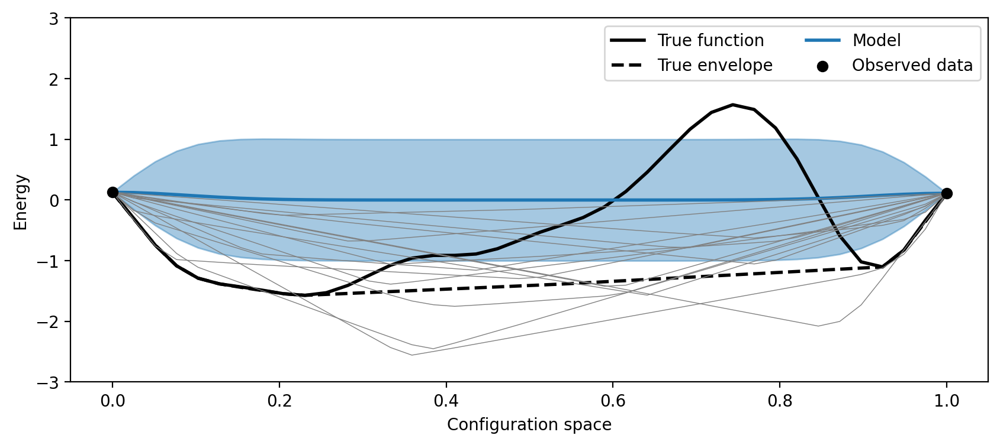

In [16]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)
# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

plt.figure(figsize=(10,4))

# Plot true function, convex hull, and GP model mean + uncertainty
plt.plot(knot_x, true_y, "k", lw=2, label="True function")
plt.plot(knot_x, true_envelope.T, ls="dashed", label="True envelope", lw=2, c="k")
plt.plot(knot_x, pred_mean, lw=2, c="tab:blue", label="Model")
y_err = jnp.sqrt(jnp.diag(pred_cov)) 
plt.fill_between(knot_x, pred_mean - y_err, pred_mean + y_err, alpha=0.4, color="tab:blue")
# Plot convex hulls of posterior samples
plt.plot(knot_x, envelopes[:15,:].T, lw=0.5, c="gray")

# Plot data / next evaluation
plt.scatter(train_x, train_y, label="Observed data", c="k", zorder=5)

plt.legend(ncol=2)

plt.ylim(-3,3); plt.xlabel("Configuration space"); plt.ylabel("Energy")

Iteration:  0
Iteration:  1
Iteration:  2
Iteration:  3
Iteration:  4
Iteration:  5
Iteration:  6


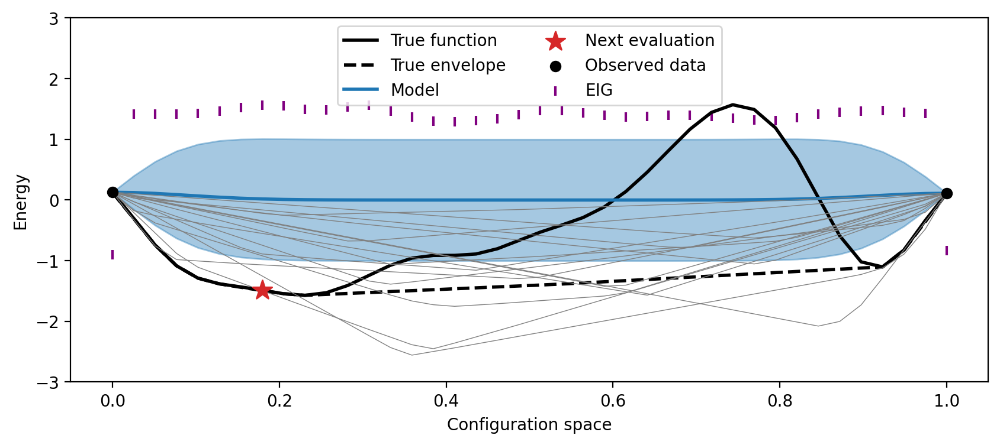

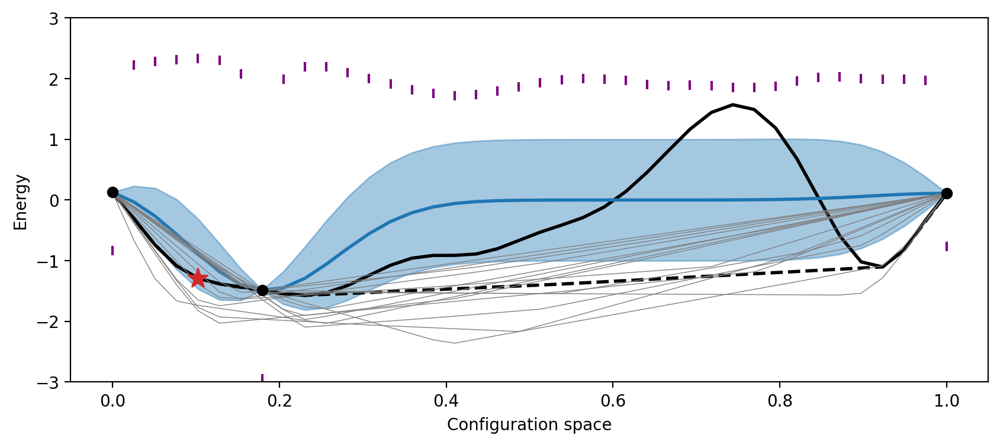

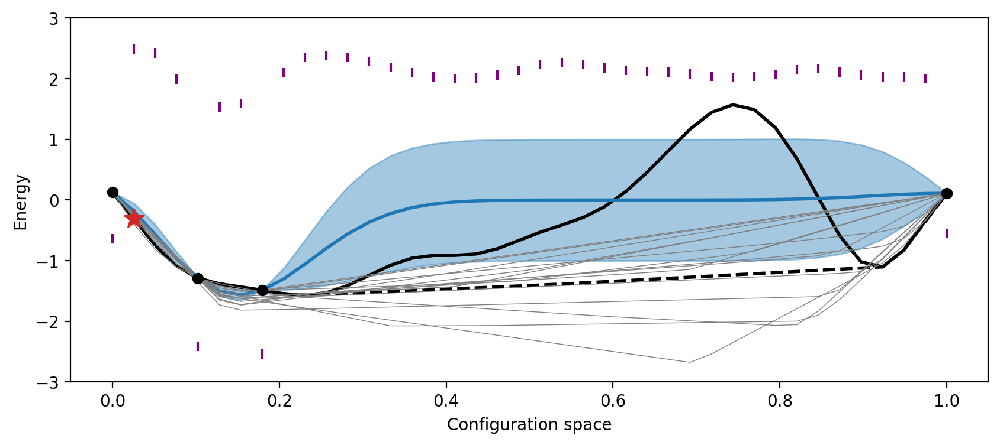

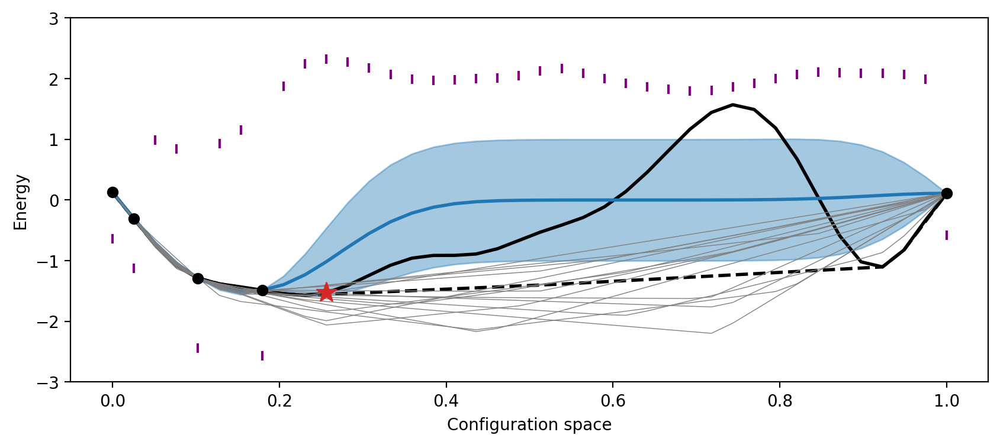

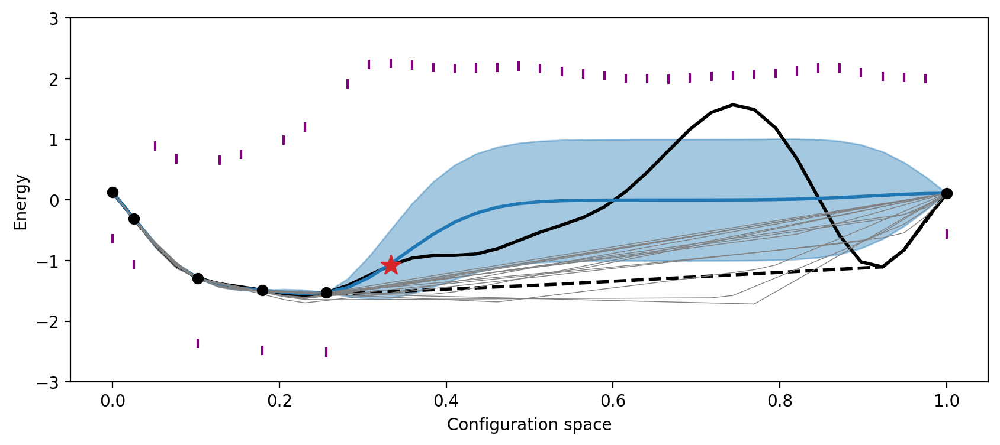

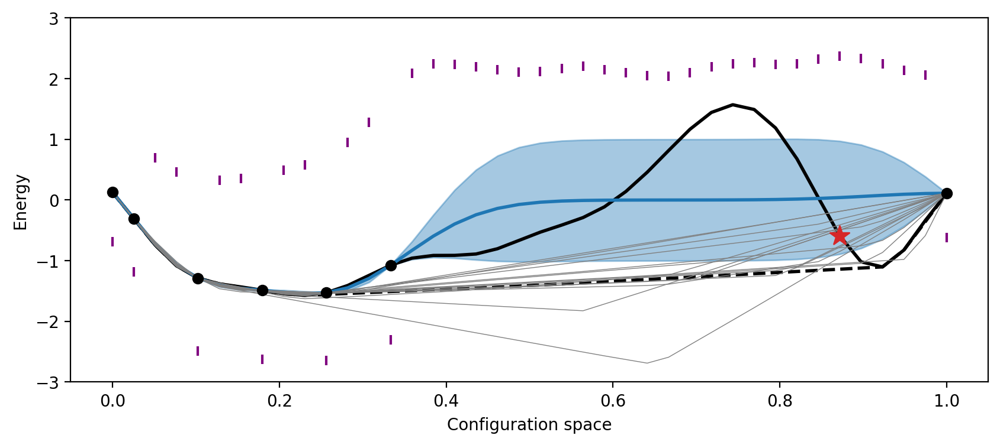

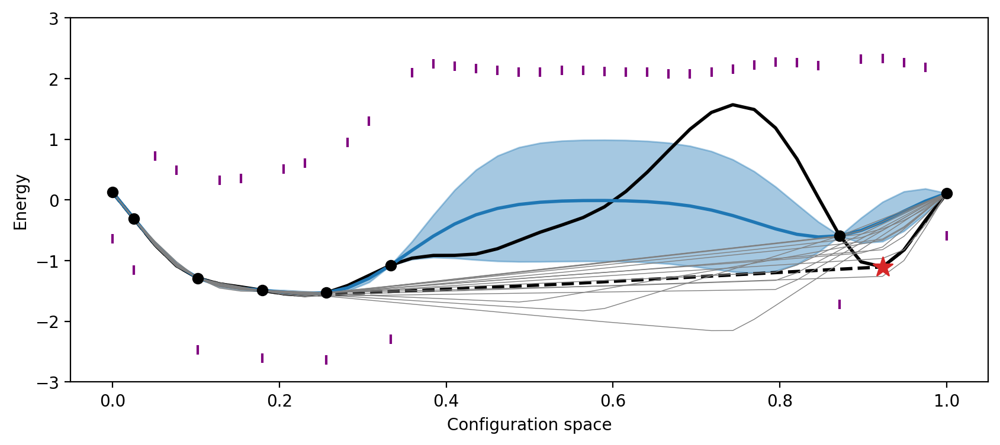

In [20]:
seed=16

# Length scale for the kernel
ls = 0.09
npr.seed(seed); rng_key = jrnd.PRNGKey(seed)

true_y, true_envelope = generate_true_function(knot_N, kernel, ls)

num_iters = 7

# Let's imagine that we start out by observing the two end points.
train_x = jnp.array([knot_x[0], knot_x[-1]])
train_y = jnp.array([true_y[0], true_y[-1]])
data = (train_x, train_y)
pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N)

for i in range(num_iters):
    print("Iteration: ", i)
    next_x, entropy_change = get_next_candidate(data, knot_x, rng_key, T=50, J=50)
    next_x = entropy_change.argmax()
    
    if i == 0:
        plot_legend = True
    else:
        plot_legend = False
    
    # plot model and suggested candidate configuration
    plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=True, legend=plot_legend)
    
    # add observations to data
    data = add_observation(data, true_y, next_x)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N) 

In [49]:
compute_distances(data, true_envelope).mean()

DeviceArray(0.11370171, dtype=float64)

# 2-simplex example

(Incomplete)

Goal: run on a 2-simplex example and visualize on a triangle.
Compare to the baseline (no convex hull info). 

Questions:
* How should we construct the design space?
* How to best verify the convex hull code?

In [303]:
import ternary

def plot_triangle(pts, tight_pts, data, next_x = None, plot_design = True):
    fontsize=20
    ### Scatter Plot
    scale = 1
    figure, tax = ternary.figure(scale=scale)
    #tax.set_title("", fontsize=20)
    tax.boundary(linewidth=2.0)
    #tax.gridlines(multiple=1, color="blue")
    
    x_train_pts = []
    for x in data[0]:
        x_train_pts.append((x[0], x[1], 1-x.sum()))

    if plot_design:
        tax.scatter(pts, marker=".", label="Design space",  sizes=jnp.ones(len(pts))*150, c="gray", zorder=3)
    tax.scatter(x_train_pts, marker=".", label="Observation", sizes=jnp.ones(len(pts))*250, zorder=3, c="k")
    tax.scatter(tight_pts, marker="*", label="Tight points", sizes=jnp.ones(len(pts))*250, zorder=5, c="tab:blue", alpha=0.5)
    
    if next_x != None:
        tax.scatter([pts[next_x]], marker="*", label="Tight points", sizes=jnp.ones(len(pts))*250, zorder=6, c="tab:red")

    tax.legend(loc="upper right")
    tax.right_corner_label("B", fontsize=fontsize)
    tax.top_corner_label("A", fontsize=fontsize)
    tax.left_corner_label("C", fontsize=fontsize)
    tax.get_axes().axis('off')
    tax.clear_matplotlib_ticks()
    tax.ticks(axis='lbr', linewidth=1, multiple=1, offset=0.02, fontsize=12)
    tax.show()

ModuleNotFoundError: No module named 'ternary'

In [126]:
n_grid = 10

nx, ny = (n_grid, n_grid)
x = jnp.linspace(0, 1, nx)
y = jnp.linspace(0, 1, ny)
xv, yv = jnp.meshgrid(x, y)
train_x = jnp.array([xv.flatten(),yv.flatten()]).T
# filter out things that are greater than 1
design_space = train_x[train_x.sum(1) <= 1]
pts = []
for x in design_space:
    pts.append((x[0], x[1], 1-x.sum()))
    
knot_N = len(design_space)

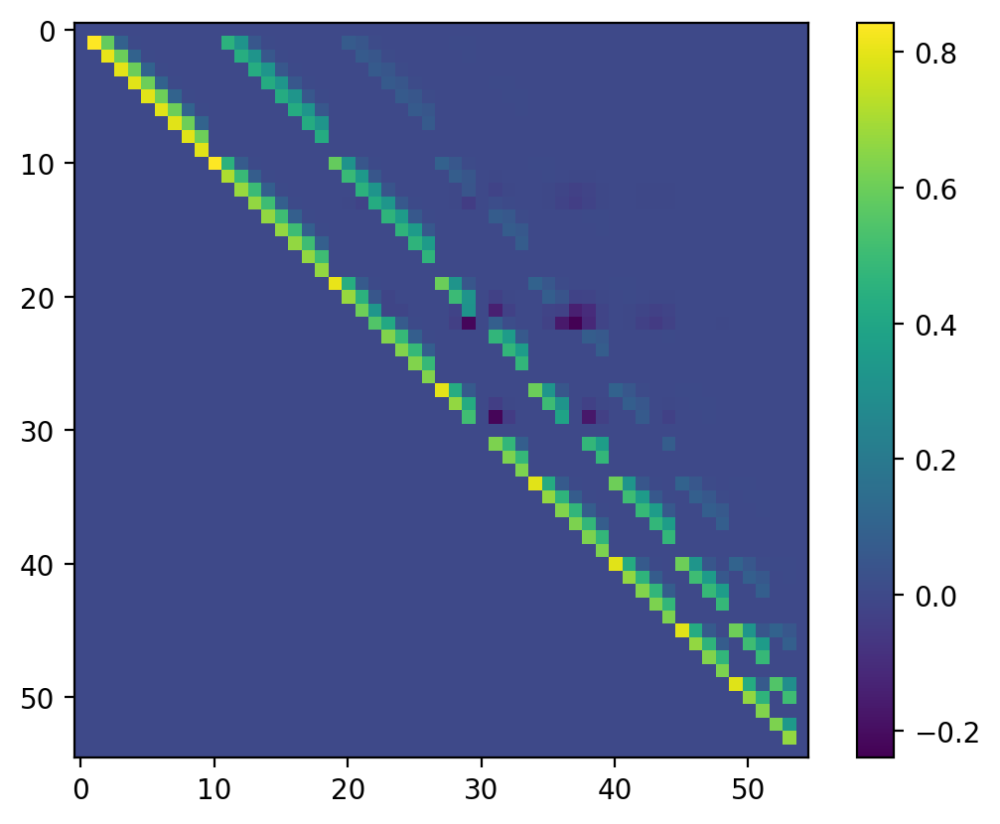

In [127]:
# generate data from the above design

npr.seed(10)

true_y, true_envelope = generate_true_function(design_space, knot_N)

tights = (true_y - true_envelope) <= 1e-3
tight_designs = design_space[tights.ravel(),:]
tight_pts = []
for x in tight_designs:
    tight_pts.append((x[0], x[1], 1-x.sum()))
    
    
# Set random seed
#npr.seed(2)
rng_key = jrnd.PRNGKey(1)

num_iters = 1
design_inds = jnp.array(range(knot_N))

# observations
train_x = jnp.array([design_space[0], design_space[30], design_space[-1]])
train_y = jnp.array([true_y[0], true_y[30], true_y[-1]])
data = (train_x, train_y)

pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space)

plt.figure(); plt.imshow(pred_cK); plt.colorbar()

Iteration:  0
(Array([[0.        , 0.        ],
       [0.33333333, 0.33333333],
       [0.        , 1.        ]], dtype=float64), Array([ 1.33158651, -0.47721525,  0.32538117], dtype=float64))
18 [-6.56118094e+00 -5.15465328e-01 -1.40976773e-01 -2.43243832e+00
 -4.42821830e-02 -2.33819129e-05  2.49965871e-06  2.49999368e-06
  2.49999375e-06  2.49999375e-06 -5.15465328e-01 -6.23624683e+00
  1.35542460e-01 -1.40976773e-01  4.90078384e-01  5.20224401e-01
  5.20241758e-01  5.20241790e-01  5.20241791e-01 -1.40976773e-01
  1.35542460e-01 -6.23624683e+00 -5.15465328e-01  4.90747144e-01
  5.19594370e-01  5.20225179e-01  5.20241721e-01 -2.43243832e+00
 -1.40976773e-01 -5.15465328e-01 -6.56118094e+00 -5.15393415e-01
 -8.77921111e-02 -3.87083470e-03 -4.42821830e-02  4.90078384e-01
  4.90747144e-01 -5.15393415e-01 -6.23623343e+00  1.91688192e-01
 -2.33819129e-05  5.20224401e-01  5.19594370e-01 -8.77921111e-02
  1.91688192e-01  2.49965871e-06  5.20241758e-01  5.20225179e-01
 -3.87083470e-03  2.499

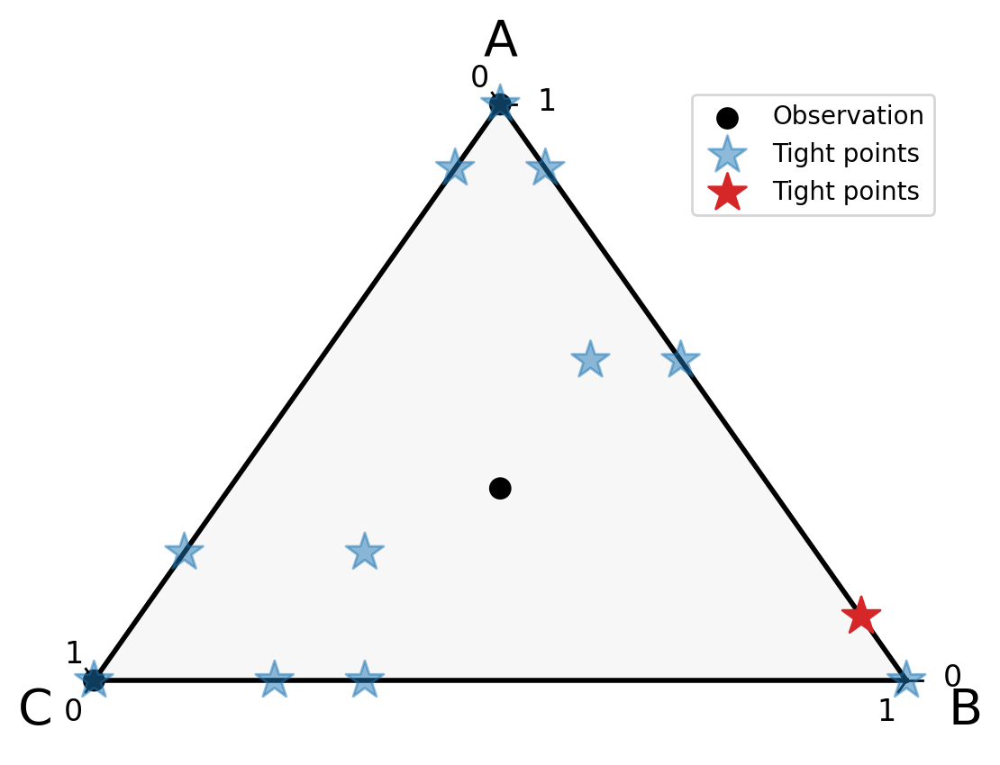

Iteration:  1
(Array([[0.        , 0.        ],
       [0.33333333, 0.33333333],
       [0.        , 1.        ],
       [0.88888889, 0.11111111]], dtype=float64), Array([ 1.33158651, -0.47721525,  0.32538117,  1.01111763], dtype=float64))
18 [-6.56118094e+00 -5.15465328e-01 -1.40976773e-01 -2.43243832e+00
 -4.42821830e-02 -2.33819129e-05  2.49965871e-06  2.49999368e-06
  2.49999375e-06  2.49999375e-06 -5.15465328e-01 -6.23624683e+00
  1.35542460e-01 -1.40976773e-01  4.90078384e-01  5.20224401e-01
  5.20241758e-01  5.20241790e-01  5.20241791e-01 -1.40976773e-01
  1.35542460e-01 -6.23624683e+00 -5.15465328e-01  4.90747144e-01
  5.19594370e-01  5.20225179e-01  5.20241721e-01 -2.43243832e+00
 -1.40976773e-01 -5.15465328e-01 -6.56118094e+00 -5.15393415e-01
 -8.77921111e-02 -3.87083470e-03 -4.42821830e-02  4.90078384e-01
  4.90747144e-01 -5.15393415e-01 -6.23623343e+00  1.91688192e-01
 -2.33819129e-05  5.20224401e-01  5.19594370e-01 -8.77921111e-02
  1.91688192e-01  2.49965871e-06  5.202417

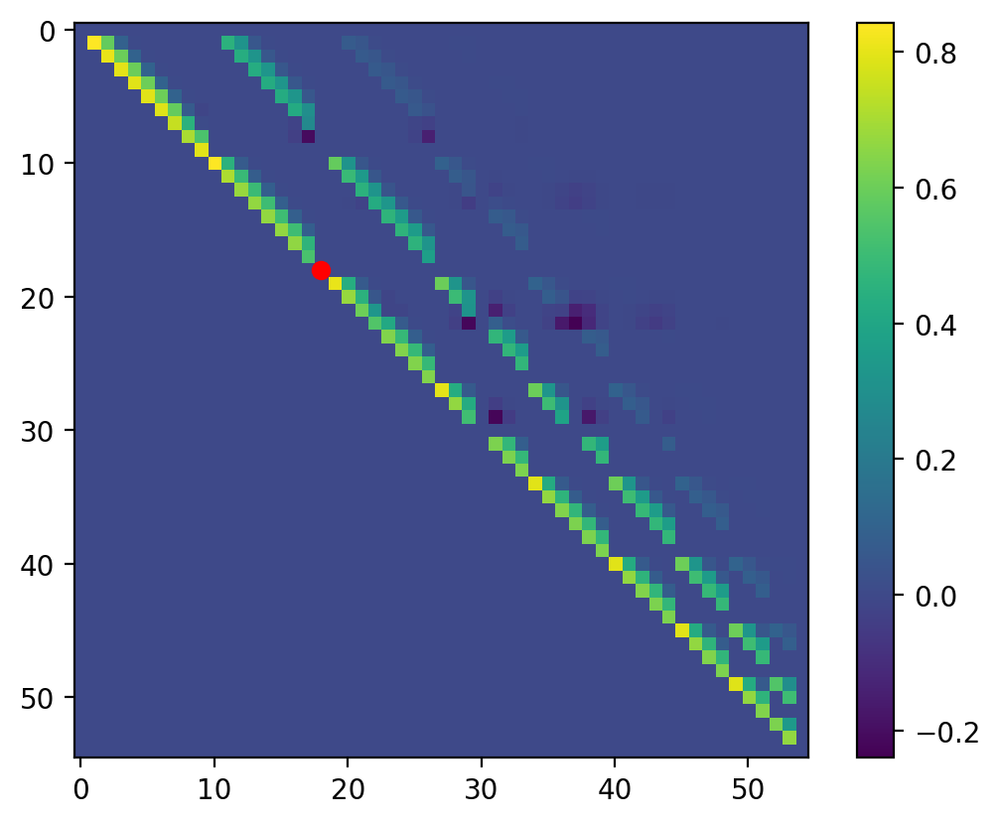

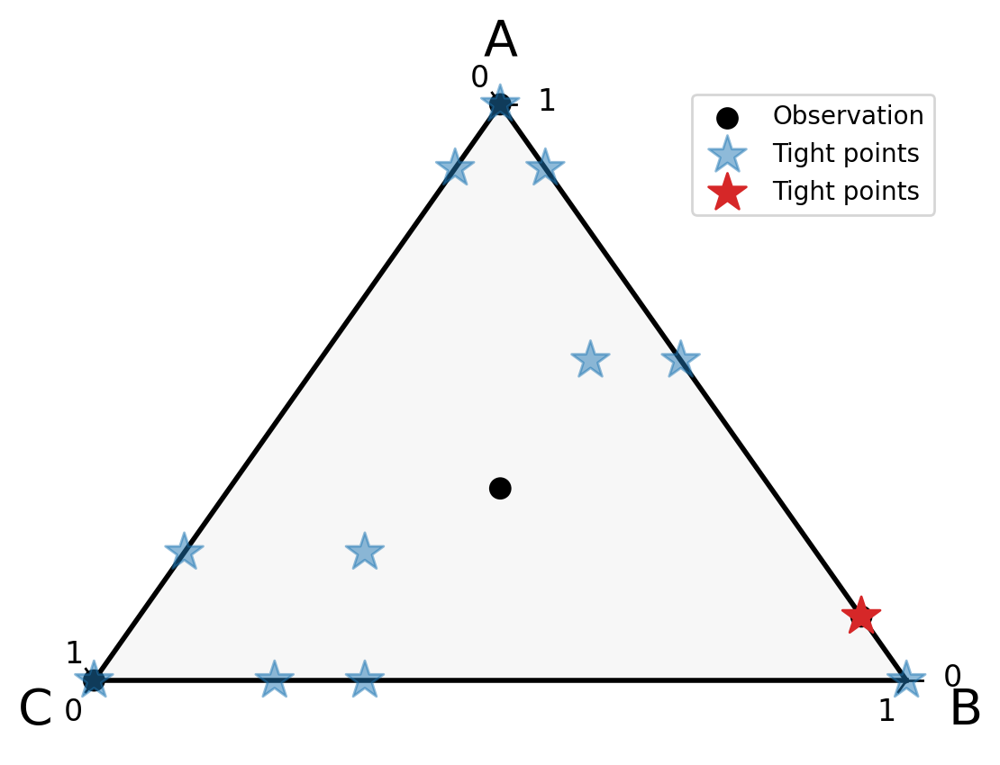

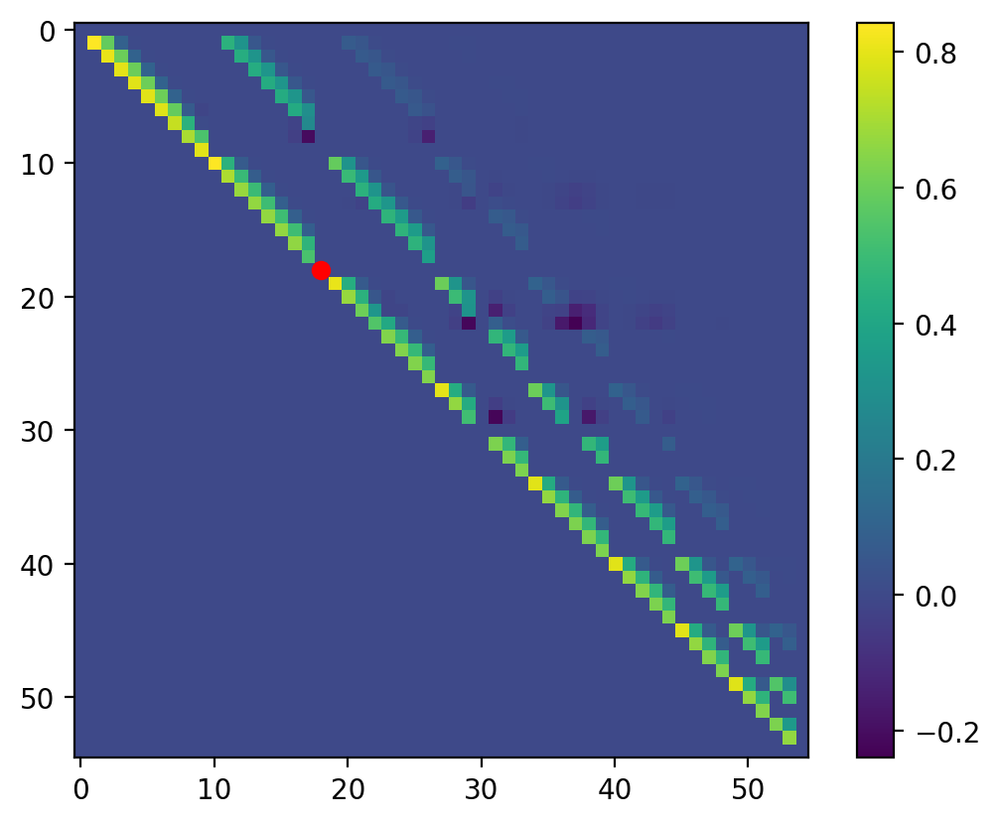

In [128]:
## baseline

num_iters = 2

# Note 2/20: something isn't right here

for i in range(num_iters):
    
    print("Iteration: ", i)    
    print(data)
    next_x, entropy_change = get_next_candidate_baseline(data, design_space, design_space)
    print(next_x, entropy_change)

    plot_triangle(pts, tight_pts, data, next_x, plot_design=False)
    # add observations to data
    data = add_observation(data, true_y, next_x, design_space, design_inds)
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space) 

    # plot covariance matrix
    plt.figure(); plt.imshow(pred_cK); plt.colorbar()
    plt.scatter(next_x, next_x, c="red")

In [129]:
%time next_x, entropy_change = get_next_candidate(data, design_inds, design_space, rng_key, T=30, J=30)

KeyboardInterrupt: 

In [ ]:
for i in range(num_iters):
    print("Iteration: ", i)
    %time next_x, entropy_change = get_next_candidate(data, design_inds, design_space, rng_key, T=50, J=50)
    print(entropy_change)
    
    # plot model and suggested candidate configuration
    #plot_candidate(knot_x, true_y, true_envelope, pred_mean, pred_cov, envelopes, data, next_x, entropy_change, plot_eig=False)
    
    # add observations to data and remove from list of designs to look at 
    data = add_observation(data, true_y, next_x, design_space)
    #design_inds = jnp.delete(design_inds, next_x)
    
    # this is just for plotting... factor this computation out later on so we're doing it twice
    pred_mean, pred_cov, pred_cK, pred_Y, envelopes = update_model(data, knot_N, design_space) 
    
#distances = compute_distances(data, true_envelope)
#distances.mean()